In [1]:
'''
Feature Generator + cls2
unshared fusion model
full     ------------- | -----> cls loss
                        ] ---> cas loss
missing  --------- |---|
         --------- |_| 
         --------- |_|
         --------- |_|
missing 4 stream
'''

'\nFeature Generator + cls2\nunshared fusion model\nfull     ------------- | -----> cls loss\n                        ] ---> cas loss\nmissing  --------- |---|\n         --------- |_| \n         --------- |_|\n         --------- |_|\nmissing 4 stream\n'

In [2]:
import os
import os.path as osp
import numpy as np
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn.functional as F
from torchsummary import summary
from torchvision.transforms import Compose
from torch.utils.data import Dataset, DataLoader
import glob
import scipy.io as sio
from skimage.transform import resize, rescale, rotate
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn import metrics
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from resnet import resnet18, resnet34, BasicBlock
from grad_cam import GradCAM

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   
os.environ["CUDA_VISIBLE_DEVICES"]="0"


In [3]:
def seed_everything(seed_value):
    random.seed(seed_value)
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    os.environ['PYTHONHASHSEED'] = str(seed_value)
    
    if torch.cuda.is_available(): 
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True

seed = 20
seed_everything(seed)

In [4]:
pat_num = 285
x_p = np.zeros(pat_num,)
# target value
y_p = np.zeros(pat_num,)
y_p[:210] = 1
indices = np.arange(pat_num)
x_train_p, x_valid_p, y_train_p, y_valid_p, idx1, idx2 = train_test_split(x_p, y_p, indices, test_size=0.2, stratify=y_p, random_state=20)

In [5]:
class Trainset(Dataset):
  'Characterizes a dataset for PyTorch'
  def __init__(self, datas, labels, transform=None):
        'Initialization'
        self.labels = labels
        self.datas = datas
        self.transform = transform

  def __len__(self):
        'Denotes the total number of samples'
        return len(self.datas)

  def __getitem__(self, index):
        'Generates one sample of data'
        
        # Load data and get label
        X = self.datas[index]
        y = self.labels[index]
        
        if self.transform:
            X = self.transform(X)
        
        missing = X.copy()
        ch1 = np.random.rand()
        ch2 = np.random.rand()
        ch3 = np.random.rand()
        ch4 = np.random.rand()
        modal_check = np.zeros(4)  # drop info
        if ch1 > 0.5:
            missing[0] = 0
            modal_check[0] = 1
        if ch2 > 0.5:
            missing[1] = 0
            modal_check[1] = 1
        if ch3 > 0.5:
            missing[2] = 0
            modal_check[2] = 1
        if ch4 > 0.5:
            missing[3] = 0
            modal_check[3] = 1

        if min(ch1, ch2, ch3, ch4) > 0.5:
            chanel_idx = np.random.choice(4)
            missing[chanel_idx] = X[chanel_idx]
            modal_check[chanel_idx] = 0
            
        if max(ch1, ch2, ch3, ch4) < 0.5:
            chanel_idx = np.random.choice(4)
            missing[chanel_idx] = 0
            modal_check[chanel_idx] = 1

        binary_label = '0b'
        for i in range(4):
          if modal_check[i] == 1:
            binary_label += '1'
          else:
            binary_label += '0'
        disc_label = int(binary_label, 2)

        return X, missing, y, modal_check

In [6]:
class Targetset(Dataset):
  'Characterizes a dataset for PyTorch'
  def __init__(self, datas, labels, transform=None):
        'Initialization'
        self.labels = labels
        self.datas = datas
        self.transform = transform

  def __len__(self):
        'Denotes the total number of samples'
        return len(self.datas)

  def __getitem__(self, index):
        'Generates one sample of data'
        
        # Load data and get label
        X = self.datas[index]
        y = self.labels[index]
        
        if self.transform:
            X = self.transform(X)
        
        missing = X.copy()
        ch1 = np.random.rand()
        ch2 = np.random.rand()
        ch3 = np.random.rand()
        ch4 = np.random.rand()
        if ch1 > 0.5:
            missing[0] = 0
        if ch2 > 0.5:
            missing[1] = 0
        if ch3 > 0.5:
            missing[2] = 0
        if ch4 > 0.5:
            missing[3] = 0

        if min(ch1, ch2, ch3, ch4) > 0.5:
            chanel_idx = np.random.choice(4)
            missing[chanel_idx] = X[chanel_idx]
            
        if max(ch1, ch2, ch3, ch4) < 0.5:
            chanel_idx = np.random.choice(4)
            missing[chanel_idx] = 0

        return missing, y

In [7]:
class Validset(Dataset):
  'Characterizes a dataset for PyTorch'
  def __init__(self, datas, labels):
        'Initialization'
        self.labels = labels
        self.datas = datas
        

  def __len__(self):
        'Denotes the total number of samples'
        return len(self.datas)

  def __getitem__(self, index):
        'Generates one sample of data'
        
        # Load data and get label
        X = self.datas[index]
        y = self.labels[index]
        
        missing = X.copy()
        ch1 = np.random.rand()
        ch2 = np.random.rand()
        ch3 = np.random.rand()
        ch4 = np.random.rand()
        if ch1 > 0.5:
            missing[0] = 0
        if ch2 > 0.5:
            missing[1] = 0
        if ch3 > 0.5:
            missing[2] = 0
        if ch4 > 0.5:
            missing[3] = 0

        if min(ch1, ch2, ch3, ch4) > 0.5:
            chanel_idx = np.random.choice(4)
            missing[chanel_idx] = X[chanel_idx]
            
        if max(ch1, ch2, ch3, ch4) < 0.5:
            chanel_idx = np.random.choice(4)
            missing[chanel_idx] = 0

        return X, missing, y

In [8]:
def transforms(scale=None, angle=None, flip_prob=None):
    transform_list = []

    if scale is not None:
        transform_list.append(Scale(scale))
    if angle is not None:
        transform_list.append(Rotate(angle))
    if flip_prob is not None:
        transform_list.append(HorizontalFlip(flip_prob))
    if flip_prob is not None:
        transform_list.append(VerticalFlip(flip_prob))
#     transform_list.append(AddGaussianNoise())

    return Compose(transform_list)

class AddGaussianNoise(object):
    def __init__(self, mean=0., std=0.1):
        self.std = std
        self.mean = mean
        
    def __call__(self, image):
        return image + np.random.randn(*image.shape) * self.std + self.mean

class Scale(object):

    def __init__(self, scale):
        self.scale = scale

    def __call__(self, image):
        img_size = image.shape[1]

        scale = np.random.uniform(low=1.0 - self.scale, high=1.0 + self.scale)
        scale_image = np.zeros_like(image)

        for i in range(4):
            img = rescale(
                image[i],
                (scale, scale),
                preserve_range=True,
                mode="constant",
                cval=image[i][0][0]
            )
            
            if scale < 1.0:
                diff = (img_size - img.shape[0]) / 2.0
                padding = ((int(np.floor(diff)), int(np.ceil(diff))),) * 2
                img = np.pad(img, padding, mode="constant", constant_values=img[0,0])

            else:
                x_min = (img.shape[0] - img_size) // 2
                x_max = x_min + img_size
                img = img[x_min:x_max, x_min:x_max]
                
            scale_image[i] = img

        return scale_image

class Rotate(object):

    def __init__(self, angle):
        self.angle = angle

    def __call__(self, image):

        angle = np.random.uniform(low=-self.angle, high=self.angle)
        rotate_image = np.zeros_like(image)

        for i in range(4):
            temp = image[i].copy() # 128*128
            temp = rotate(temp, angle, resize=False, preserve_range=True, mode="constant", cval=temp[0,0])
            rotate_image[i] = temp
        
        return rotate_image

class VerticalFlip(object):

    def __init__(self, flip_prob):
        self.flip_prob = flip_prob

    def __call__(self, image):

        if np.random.rand() > self.flip_prob:
            return image

        image = image[..., ::-1].copy()

        return image
    
class HorizontalFlip(object):

    def __init__(self, flip_prob):
        self.flip_prob = flip_prob

    def __call__(self, image):

        if np.random.rand() > self.flip_prob:
            return image

        image = image[..., ::-1, :].copy()

        return image    

In [9]:
def pad_sample(x):
    image = x
    a = image.shape[0]
    b = image.shape[1]
    if a == b:
        return image
    diff = (max(a, b) - min(a, b)) / 2.0
    if a > b:
        padding = ((0, 0), (int(np.floor(diff)), int(np.ceil(diff))))
    else:
        padding = ((int(np.floor(diff)), int(np.ceil(diff))), (0, 0))
    padding = padding + ((0, 0),)
    image = np.pad(image, padding, mode="constant", constant_values=0)
    return image

In [10]:
def init_weights(m):
        if type(m) == (nn.Conv2d or nn.Linear):
            nn.init.kaiming_normal_(m.weight)

In [11]:
class BasicConv(nn.Module):

    def __init__(self, in_channels, out_channels, **kwargs):
        super(BasicConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, bias=False, **kwargs)
        self.bn = nn.BatchNorm2d(out_channels, eps=0.001)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return F.relu(x, inplace=True)

class InceptionA(nn.Module):

    def __init__(self, in_channels):
        super().__init__()
        conv_block = BasicConv
        base = in_channels // 4
        self.branch1x1 = conv_block(in_channels, base, kernel_size=1)

        self.branch3x3_1 = conv_block(in_channels, base-32, kernel_size=1)
        self.branch3x3_2 = conv_block(base-32, base, kernel_size=3, padding=1)

        self.branch5x5_1 = conv_block(in_channels, base-32, kernel_size=1)
        self.branch5x5_2 = conv_block(base-32, base, kernel_size=3, padding=1)
        self.branch5x5_3 = conv_block(base, base, kernel_size=3, padding=1)

        self.branch_pool = conv_block(in_channels, base, kernel_size=1)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch3x3 = self.branch3x3_1(x)
        branch3x3 = self.branch3x3_2(branch3x3)

        branch5x5 = self.branch5x5_1(x)
        branch5x5 = self.branch5x5_2(branch5x5)
        branch5x5 = self.branch5x5_3(branch5x5)

        branch_pool = F.avg_pool2d(x, kernel_size=3, stride=1, padding=1)
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch3x3, branch5x5, branch_pool]
        
        return torch.cat(outputs, 1)
    
class InceptionB(nn.Module):

    def __init__(self, in_channels):
        super().__init__()
        conv_block = BasicConv
        base = in_channels // 4
        self.branch1x1 = conv_block(in_channels, base, kernel_size=1)

        self.branch3x3_1 = conv_block(in_channels, base-32, kernel_size=1)
        self.branch3x3_2 = conv_block(base-32, base, kernel_size=5, padding=2)

        self.branch5x5_1 = conv_block(in_channels, base-32, kernel_size=1)
        self.branch5x5_2 = conv_block(base-32, base, kernel_size=5, padding=2)
        self.branch5x5_3 = conv_block(base, base, kernel_size=5, padding=2)

        self.branch_pool = conv_block(in_channels, base, kernel_size=1)

    def forward(self, x):
        branch1x1 = self.branch1x1(x)

        branch3x3 = self.branch3x3_1(x)
        branch3x3 = self.branch3x3_2(branch3x3)

        branch5x5 = self.branch5x5_1(x)
        branch5x5 = self.branch5x5_2(branch5x5)
        branch5x5 = self.branch5x5_3(branch5x5)

        branch_pool = F.avg_pool2d(x, kernel_size=3, stride=1, padding=1)
        branch_pool = self.branch_pool(branch_pool)

        outputs = [branch1x1, branch3x3, branch5x5, branch_pool]
        
        return torch.cat(outputs, 1)

class InceptionR_S(nn.Module):
    def __init__(self, in_channels, scale=1.0):
        super().__init__()
        conv_block = BasicConv
        self.scale = scale
        
        self.branch_0 = conv_block(in_channels, 48, kernel_size=1, stride=2, padding=0)
        self.branch_1 = nn.Sequential(
            conv_block(in_channels, 48, kernel_size=1, stride=2, padding=0),
            conv_block(48, 48, kernel_size=3, stride=1, padding=1)
        )
        self.branch_2 = nn.Sequential(
            conv_block(in_channels, 48, kernel_size=1, stride=2, padding=0),
            conv_block(48, 64, kernel_size=3, stride=1, padding=1),
            conv_block(64, 96, kernel_size=3, stride=1, padding=1)
        )
        self.conv = nn.Conv2d(192, 512, kernel_size=1, stride=1, padding=0, bias=True)
        self.res_conv = nn.Conv2d(in_channels, 512, kernel_size=1, stride=2, padding=0, bias=True)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x):
        x0 = self.branch_0(x)
        x1 = self.branch_1(x)
        x2 = self.branch_2(x)
        x_res = torch.cat((x0, x1, x2), dim=1)
        x_res = self.conv(x_res)
        x_short = self.res_conv(x)
        return self.relu(x_short + self.scale * x_res)

In [45]:
class Fusion(nn.Module):

    def __init__(self, feature):
        super().__init__()
        self.features = feature(4, cond=0, fm=True, atten=True, atten_type='CBAM')
#         self.features2 = feature(1, 0,True)
#         self.features3 = feature(1, 0,True)
#         self.features4 = feature(1, 0,True)
        
        self.in_channels = 64
        num_block = [2, 2, 2, 2]
#         self.conv2_x = self._make_layer(BasicBlock, 64, num_block[0], 1)
#         self.conv3_x = self._make_layer(BasicBlock, 256, num_block[1], 2)
        self.in_channels = 512 
#         self.conv4_x = self._make_layer(BasicBlock, 512, num_block[2], 2)
#         self.conv5_x = self._make_layer(BasicBlock, 512, num_block[3], 2)
        
        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, 2)


    def forward(self, x):
        
        fe = self.features(x)
#         t1 = self.features2(x[:, 1].reshape(x.shape[0], 1, x.shape[2], x.shape[3]))
#         t2 = self.features3(x[:, 2].reshape(x.shape[0], 1, x.shape[2], x.shape[3]))
#         flair = self.features4(x[:, 3].reshape(x.shape[0], 1, x.shape[2], x.shape[3]))
        
#         z = torch.cat((t1c, t1, t2, flair), 1)
#         z = self.i_block(z)
        
#         z = self.conv3_x(z)
#         z = self.conv4_x(z)
#         z = self.conv5_x(z)
        
        z = self.avg_pool(fe)
        z = z.view(z.size(0), -1)
        z = self.fc(z)

        
        return z
    
    def _make_layer(self, block, out_channels, num_blocks, stride):
            """make resnet layers(by layer i didnt mean this 'layer' was the 
            same as a neuron netowork layer, ex. conv layer), one layer may 
            contain more than one residual block 
            Args:
                block: block type, basic block or bottle neck block
                out_channels: output depth channel number of this layer
                num_blocks: how many blocks per layer
                stride: the stride of the first block of this layer

            Return:
                return a resnet layer
            """

            # we have num_block blocks per layer, the first block 
            # could be 1 or 2, other blocks would always be 1
            strides = [stride] + [1] * (num_blocks - 1)
            layers = []
            for stride in strides:
                layers.append(block(self.in_channels, out_channels, stride))
                self.in_channels = out_channels * block.expansion

            return nn.Sequential(*layers)
        
class CLS(nn.Module): # classifier

    def __init__(self, in_ch=512, num_class=2, temp=1):
        super().__init__()
        
        self.last = nn.Linear(in_ch, num_class)
        self.temp = temp

    def forward(self, x):
        
#         x = F.normalize(x)
        out = self.last(x) / self.temp
        
        return out

In [13]:
def sensi_speci(y_true, y_pred):
    # y_pred shape : (n,)
    pred = y_pred > 0.5
    pred = pred.reshape(-1).astype(np.uint8)

    zero_one =0
    zero_zero =0
    one_zero =0
    one_one =0
    # one -> true
    for tr, pr in zip(y_true.astype(np.uint8), pred):
        tr = str(tr).strip()
        pr = str(pr).strip()
        if pr == '0':
            if tr == '0':
                zero_zero +=1
            elif tr =='1':
                zero_one +=1
        elif pr == '1':
            if tr == '0':
                one_zero +=1
            elif tr =='1':
                one_one +=1

    try: specificity = zero_zero / (zero_zero + one_zero)
    except: specificity=0
    try: sensitivity = one_one / (zero_one + one_one)    
    except: sensitivity=0
    try: acc = (one_one + zero_zero) / (zero_zero + one_zero + zero_one + one_one)    
    except: acc = 0

    return acc, sensitivity, specificity


In [14]:
def cross_entropy(pred, targets):
    logsoftmax = nn.LogSoftmax(dim=1)
    softmax = nn.Softmax(dim=1)
    soft_targets = softmax(targets)
    return torch.mean(torch.sum(- soft_targets * logsoftmax(pred), 1))

In [40]:
def get_dataloader(X, y, tr_idx, val_idx, shuffle=True):
    batch = 32
    x_shape = X.shape[3:]
    X_tr = np.reshape(X[tr_idx], (-1,4, x_shape[0], x_shape[1]))
    y_tr = np.reshape(y[tr_idx], (-1,))
    X_val = np.reshape(X[val_idx], (-1,4, x_shape[0], x_shape[1]))
    y_val = np.reshape(y[val_idx], (-1,))
    
    print(len(tr_idx), len(val_idx))
    print(X_tr.shape, X_val.shape)
    
    
    trainset = Trainset(X_tr, y_tr, transform=transforms(angle=2, flip_prob=0.5))
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch,
                                              shuffle=shuffle, drop_last=True, num_workers=2)

    validset = Validset(X_val, y_val)
    validloader = torch.utils.data.DataLoader(validset, batch_size=batch,
                                              shuffle=shuffle, num_workers=1)

    return trainloader, validloader

def get_testloader(X, y):
    batch = 32
    x_shape = X.shape[3:]
    X_te = np.reshape(X, (-1,4, x_shape[0], x_shape[1]))
    y_te = np.reshape(y, (-1,))
    
    print(X_te.shape)
    
    
    testset = Validset(X_te, y_te)
    testloader = torch.utils.data.DataLoader(testset, batch_size=batch,
                                              shuffle=False, num_workers=1)


    return testloader

def get_dataset(X, y, tr_idx, val_idx):
    # patient_level
    offset = 17
    X_tr = []
    y_tr = []
    
    for i in tr_idx:
        X_tr.append(X[i*offset:i*offset + offset])
        y_tr.append(y[i*offset:i*offset + offset])
            
    X_val = []
    y_val = []
    
    for i in val_idx:
        X_val.append(X[i*offset:i*offset + offset])
        y_val.append(y[i*offset:i*offset + offset])
            
    X_tr = np.stack(X_tr)
    y_tr = np.stack(y_tr)
    X_val = np.stack(X_val)
    y_val = np.stack(y_val)
    
    print(len(tr_idx), len(val_idx))
    print(X_tr.shape, X_val.shape)
    
    return X_tr, X_val, y_tr, y_val

In [16]:
def get_dataloader2(X, y, tr_idx, val_idx, shuffle=True):
    batch = 32
    x_shape = X.shape[3:]
    X_tr = []
    y_tr = []
    X_val = []
    y_val = []
    
    for i in tr_idx:
        if y[i][0] == 1:
            X_tr.append(X[i, :15])
            y_tr.append(y[i, :15])
        elif y[i][0] == 0:
            X_tr.append(X[i])
            y_tr.append(y[i])
            
    for i in val_idx:
        if y[i][0] == 1:
            X_val.append(X[i, :15])
            y_val.append(y[i, :15])
        elif y[i][0] == 0:
            X_val.append(X[i])
            y_val.append(y[i])
            
    X_tr = np.concatenate(X_tr, 0)
    y_tr = np.concatenate(y_tr, 0)
    X_val = np.concatenate(X_val, 0)
    y_val = np.concatenate(y_val, 0)
    
    print(len(tr_idx), len(val_idx))
    print(X_tr.shape, X_val.shape)
    
    
    trainset = Trainset(X_tr, y_tr, transform=transforms(angle=2, flip_prob=0.5))
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch,
                                              shuffle=shuffle, drop_last=True, num_workers=2)

    validset = Validset(X_val, y_val)
    validloader = torch.utils.data.DataLoader(validset, batch_size=batch,
                                              shuffle=shuffle, num_workers=1)

    return trainloader, validloader

def get_testloader2(X, y):
    batch = 32
    
    X_te = []
    y_te = []
    
    for i in tr_idx:
        if y[i][0] == 1:
            X_te.append(X[i, :15])
            y_te.append(y[i, :15])
        elif y[i][0] == 0:
            X_te.append(X[i])
            y_te.append(y[i])
    
    X_tr = np.concatenate(X_tr, 0)
    y_tr = np.concatenate(y_tr, 0)
    
    print(X_te.shape)
    
    
    testset = Validset(X_te, y_te)
    testloader = torch.utils.data.DataLoader(testset, batch_size=batch,
                                              shuffle=False, num_workers=1)

In [36]:
data_path = '/data/new_GBM_all_ROI_full_15_3view.npz'
data = np.load(data_path)
X, y = data['x'], data['y']
brain = None

In [41]:
pat_num = 285
x_p = np.zeros(pat_num,)
# target value
y_p = np.zeros(pat_num,)
y_p[:210] = 1
indices = np.arange(pat_num)
x_train_p, x_test_p, y_tr_p, y_test_p, idx1, idx2 = train_test_split(x_p, y_p, indices, test_size=0.2, stratify=y_p, random_state=seed)

# X_tr, X_test, y_tr, y_test = get_dataset(X, y, idx1, idx2)
X_tr, X_test, y_tr, y_test = X[idx1], X[idx2], y[idx1], y[idx2]

In [42]:
X_tr.shape

(228, 15, 4, 128, 128)

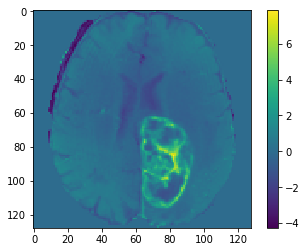

In [43]:
plt.imshow(X_tr[0,0,0])
plt.colorbar()

In [46]:
%%time
skf = StratifiedKFold(n_splits=4, shuffle=True, random_state=seed)
for fold, (tr_idx, vl_idx) in enumerate(skf.split(X_tr, y_tr_p), start=1):
    if fold != 2:
        continue
    print(f'Fold: {fold}')
    trainloader, validloader = get_dataloader(X_tr, y_tr, tr_idx, vl_idx)
    model = Fusion(resnet18)
    model.cuda()
    model.apply(init_weights)
    
    filename = '/model/fold' + str(fold) +'/Base/'
    print_every = 1
    # batch_size = 64
    num_epochs= 12

    learning_rate = 0.0001
    weight_decay = 0.0005
    train_loss, train_acc = [], []
    valid_loss, valid_acc = [], []

    loss_ce = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)
    sch = lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)
    
    for i in range(num_epochs):
        epoch_loss = 0.0
        tr_acc = 0.0
        #optimizer = lr_sch(optimizer, i)
        model.train()
        for x_batch, _, y_batch, _ in trainloader:
            x_batch = x_batch.float().to('cuda')
            y_batch = y_batch.long().to('cuda')
            outputs = model(x_batch)
            loss = loss_ce(outputs, y_batch)

            pred = np.argmax(outputs.data.cpu().numpy(), axis=1)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            correct = len(np.where(pred == y_batch.cpu().data.numpy())[0])
            tr_acc += correct

        epoch_loss /= len(trainloader)
        tr_acc /= trainloader.dataset.datas.shape[0]

        train_loss.append(epoch_loss)
        train_acc.append(tr_acc)

        va_loss = 0.0
        va_acc = 0.0
        va_loss_m = 0.0
        va_acc_m = 0.0
        va_y = []
        va_pred = []
        va_pred_missing = []
        with torch.no_grad():
            model.eval()
            # Valid accuracy
            for x_batch, missing_batch, y_batch in validloader:

                x_batch = x_batch.float().to('cuda')
                missing_batch = missing_batch.float().to('cuda')
                y_batch = y_batch.long().to('cuda')
                pred = model(x_batch)
                pred_missing = model(missing_batch)
                loss = loss_ce(pred, y_batch)
                loss_missing = loss_ce(pred_missing, y_batch)

                va_y.append(y_batch.cpu().data.numpy())
                va_pred.append(torch.softmax(pred, 1).data.cpu().numpy()[:, 1])
                va_pred_missing.append(torch.softmax(pred_missing, 1).data.cpu().numpy()[:, 1])

                pred = np.argmax(pred.data.cpu().numpy(), axis=1)
                pred_missing = np.argmax(pred_missing.data.cpu().numpy(), axis=1)

                va_loss += loss.item()
                correct = len(np.where(pred == y_batch.cpu().data.numpy())[0])
                va_acc += correct

                va_loss_m += loss_missing.item()
                correct = len(np.where(pred_missing == y_batch.cpu().data.numpy())[0])
                va_acc_m += correct


            va_loss /= len(validloader)
            va_acc /= validloader.dataset.datas.shape[0]

            va_loss_m /= len(validloader)
            va_acc_m /= validloader.dataset.datas.shape[0]

            valid_loss.append(va_loss)
            valid_acc.append(va_acc)

        if (i + 1) % print_every == 0:
            va_y = np.concatenate(va_y, 0)
            va_pred = np.concatenate(va_pred, 0)
            va_pred_missing = np.concatenate(va_pred_missing, 0)
            auc = metrics.roc_auc_score(va_y, va_pred)
            ac, sensi, speci = sensi_speci(va_y, va_pred)
            auc_m = metrics.roc_auc_score(va_y, va_pred_missing)
            ac, sensi_m, speci_m = sensi_speci(va_y, va_pred_missing)

            print('Epoch [{}/{}], Train_Loss: {:.4f}, Train_Acc: {:.4f},\
                \nValid_Loss: {:.4f}, Valid_Acc: {:.4f}, Valid_AUC: {:.4f}, Valid_sen: {:.4f}, Valid_spe: {:.4f}\
                \nValid_Loss_m: {:.4f}, Valid_Acc_m: {:.4f}, Valid_AUC_m: {:.4f}, Valid_sen_m: {:.4f}, Valid_spe_m: {:.4f}'
                  .format(i + 1, num_epochs, epoch_loss, tr_acc, 
                          va_loss, va_acc, auc, sensi, speci,
                          va_loss_m, va_acc_m, auc_m, sensi_m, speci_m))
            
#         torch.save(model.state_dict(), filename + str(i) + '_' + str(auc)[:5])

        sch.step()
        
    # test
    testloader = get_testloader(X_test, y_test)

    va_y = []
    va_pred = []
    result_text = ''

    with torch.no_grad():
        model.eval()
        model.cuda()
        # Valid accuracy
        for x_batch, _, y_batch in testloader:
            
            x_batch = x_batch.float().cuda()
            y_batch = y_batch.long().cuda()

            pred = model(x_batch)

            va_y.append(y_batch.cpu().data.numpy())
            va_pred.append(torch.softmax(pred, 1).cpu().data.numpy()[:, 1])

    va_y = np.concatenate(va_y, 0)
    va_pred = np.concatenate(va_pred, 0)
    auc = metrics.roc_auc_score(va_y, va_pred)
    acc, sensi, speci = sensi_speci(va_y, va_pred)
    print(' / Test_Acc: {:.4f}, Test_AUC: {:.4f}, Test_sensi: {:.4f}, Test_speci: {:.4f}'.format(acc, auc, sensi, speci))
    print()


Fold: 2
171 57
(2565, 4, 128, 128) (855, 4, 128, 128)


/opt/anaconda3/lib/python3.6/site-packages/torch/nn/functional.py:1351: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Epoch [1/12], Train_Loss: 0.3565, Train_Acc: 0.8324,                
Valid_Loss: 0.2173, Valid_Acc: 0.9205, Valid_AUC: 0.9677, Valid_sen: 0.9714, Valid_spe: 0.7778                
Valid_Loss_m: 0.6531, Valid_Acc_m: 0.7649, Valid_AUC_m: 0.7289, Valid_sen_m: 0.9476, Valid_spe_m: 0.2533
Epoch [2/12], Train_Loss: 0.1588, Train_Acc: 0.9349,                
Valid_Loss: 0.5004, Valid_Acc: 0.8070, Valid_AUC: 0.9498, Valid_sen: 0.9937, Valid_spe: 0.2844                
Valid_Loss_m: 1.3740, Valid_Acc_m: 0.7509, Valid_AUC_m: 0.6782, Valid_sen_m: 0.9683, Valid_spe_m: 0.1422
Epoch [3/12], Train_Loss: 0.0758, Train_Acc: 0.9766,                
Valid_Loss: 0.3130, Valid_Acc: 0.8889, Valid_AUC: 0.9443, Valid_sen: 0.9825, Valid_spe: 0.6267                
Valid_Loss_m: 1.3498, Valid_Acc_m: 0.7450, Valid_AUC_m: 0.6465, Valid_sen_m: 0.9238, Valid_spe_m: 0.2444
Epoch [4/12], Train_Loss: 0.0646, Train_Acc: 0.9801,                
Valid_Loss: 0.3027, Valid_Acc: 0.8959, Valid_AUC: 0.9376, Valid_sen: 0.9762,

In [ ]:
# 15_3view
Fold: 2
171 57
(2565, 4, 128, 128) (855, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.3507, Train_Acc: 0.8355,                
Valid_Loss: 0.2527, Valid_Acc: 0.9064, Valid_AUC: 0.9586, Valid_sen: 0.9492, Valid_spe: 0.7867                
Valid_Loss_m: 0.5574, Valid_Acc_m: 0.7462, Valid_AUC_m: 0.7253, Valid_sen_m: 0.8825, Valid_spe_m: 0.3644
Epoch [2/12], Train_Loss: 0.1880, Train_Acc: 0.9283,                
Valid_Loss: 0.1970, Valid_Acc: 0.9287, Valid_AUC: 0.9774, Valid_sen: 0.9159, Valid_spe: 0.9644                
Valid_Loss_m: 0.7999, Valid_Acc_m: 0.7135, Valid_AUC_m: 0.6792, Valid_sen_m: 0.8127, Valid_spe_m: 0.4356
Epoch [3/12], Train_Loss: 0.1001, Train_Acc: 0.9684,                
Valid_Loss: 0.2209, Valid_Acc: 0.9053, Valid_AUC: 0.9670, Valid_sen: 0.9762, Valid_spe: 0.7067                
Valid_Loss_m: 0.9611, Valid_Acc_m: 0.7310, Valid_AUC_m: 0.6778, Valid_sen_m: 0.8825, Valid_spe_m: 0.3067
Epoch [4/12], Train_Loss: 0.0699, Train_Acc: 0.9766,                
Valid_Loss: 0.2663, Valid_Acc: 0.9006, Valid_AUC: 0.9483, Valid_sen: 0.9635, Valid_spe: 0.7244                
Valid_Loss_m: 1.1804, Valid_Acc_m: 0.7053, Valid_AUC_m: 0.6485, Valid_sen_m: 0.8159, Valid_spe_m: 0.3956
Epoch [5/12], Train_Loss: 0.0603, Train_Acc: 0.9793,                
Valid_Loss: 0.2563, Valid_Acc: 0.8982, Valid_AUC: 0.9554, Valid_sen: 0.9714, Valid_spe: 0.6933                
Valid_Loss_m: 1.2158, Valid_Acc_m: 0.6959, Valid_AUC_m: 0.6349, Valid_sen_m: 0.8190, Valid_spe_m: 0.3511
Epoch [6/12], Train_Loss: 0.0521, Train_Acc: 0.9840,                
Valid_Loss: 0.2552, Valid_Acc: 0.8982, Valid_AUC: 0.9532, Valid_sen: 0.9683, Valid_spe: 0.7022                
Valid_Loss_m: 1.2469, Valid_Acc_m: 0.7018, Valid_AUC_m: 0.6556, Valid_sen_m: 0.8000, Valid_spe_m: 0.4267
Epoch [7/12], Train_Loss: 0.0550, Train_Acc: 0.9828,                
Valid_Loss: 0.2576, Valid_Acc: 0.8959, Valid_AUC: 0.9536, Valid_sen: 0.9698, Valid_spe: 0.6889                
Valid_Loss_m: 1.2342, Valid_Acc_m: 0.7064, Valid_AUC_m: 0.6416, Valid_sen_m: 0.8206, Valid_spe_m: 0.3867
Epoch [8/12], Train_Loss: 0.0520, Train_Acc: 0.9832,                
Valid_Loss: 0.2397, Valid_Acc: 0.9111, Valid_AUC: 0.9562, Valid_sen: 0.9683, Valid_spe: 0.7511                
Valid_Loss_m: 1.1376, Valid_Acc_m: 0.7088, Valid_AUC_m: 0.6783, Valid_sen_m: 0.7984, Valid_spe_m: 0.4578
Epoch [9/12], Train_Loss: 0.0466, Train_Acc: 0.9875,                
Valid_Loss: 0.2398, Valid_Acc: 0.9099, Valid_AUC: 0.9574, Valid_sen: 0.9667, Valid_spe: 0.7511                
Valid_Loss_m: 1.2187, Valid_Acc_m: 0.6901, Valid_AUC_m: 0.6454, Valid_sen_m: 0.7921, Valid_spe_m: 0.4044
Epoch [10/12], Train_Loss: 0.0553, Train_Acc: 0.9832,                
Valid_Loss: 0.2425, Valid_Acc: 0.9076, Valid_AUC: 0.9562, Valid_sen: 0.9683, Valid_spe: 0.7378                
Valid_Loss_m: 1.3762, Valid_Acc_m: 0.6854, Valid_AUC_m: 0.5889, Valid_sen_m: 0.8079, Valid_spe_m: 0.3422
Epoch [11/12], Train_Loss: 0.0580, Train_Acc: 0.9801,                
Valid_Loss: 0.2562, Valid_Acc: 0.8994, Valid_AUC: 0.9565, Valid_sen: 0.9730, Valid_spe: 0.6933                
Valid_Loss_m: 1.2167, Valid_Acc_m: 0.7053, Valid_AUC_m: 0.6440, Valid_sen_m: 0.8222, Valid_spe_m: 0.3778
Epoch [12/12], Train_Loss: 0.0499, Train_Acc: 0.9864,                
Valid_Loss: 0.2458, Valid_Acc: 0.9053, Valid_AUC: 0.9550, Valid_sen: 0.9683, Valid_spe: 0.7289                
Valid_Loss_m: 1.2180, Valid_Acc_m: 0.6924, Valid_AUC_m: 0.6399, Valid_sen_m: 0.8032, Valid_spe_m: 0.3822
(855, 4, 128, 128)
 / Test_Acc: 0.8608, Test_AUC: 0.9302, Test_sensi: 0.9016, Test_speci: 0.7467

CPU times: user 17min 20s, sys: 34.2 s, total: 17min 54s
Wall time: 2min 10s

In [ ]:
# 3d_3
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2742, Train_Acc: 0.8703,                
Valid_Loss: 0.5988, Valid_Acc: 0.7451, Valid_AUC: 0.9155, Valid_sen: 0.6835, Valid_spe: 0.9176                
Valid_Loss_m: 1.5792, Valid_Acc_m: 0.7626, Valid_AUC_m: 0.6272, Valid_sen_m: 0.8880, Valid_spe_m: 0.4118
Epoch [2/12], Train_Loss: 0.1108, Train_Acc: 0.9481,                
Valid_Loss: 0.5658, Valid_Acc: 0.7709, Valid_AUC: 0.9254, Valid_sen: 0.7213, Valid_spe: 0.9098                
Valid_Loss_m: 1.5973, Valid_Acc_m: 0.6863, Valid_AUC_m: 0.6036, Valid_sen_m: 0.7675, Valid_spe_m: 0.4588
Epoch [3/12], Train_Loss: 0.0455, Train_Acc: 0.9773,                
Valid_Loss: 0.9299, Valid_Acc: 0.7389, Valid_AUC: 0.9045, Valid_sen: 0.6891, Valid_spe: 0.8784                
Valid_Loss_m: 2.5108, Valid_Acc_m: 0.7110, Valid_AUC_m: 0.5950, Valid_sen_m: 0.8473, Valid_spe_m: 0.3294
Epoch [4/12], Train_Loss: 0.0231, Train_Acc: 0.9838,                
Valid_Loss: 0.3814, Valid_Acc: 0.8803, Valid_AUC: 0.9200, Valid_sen: 0.9286, Valid_spe: 0.7451                
Valid_Loss_m: 1.8226, Valid_Acc_m: 0.7544, Valid_AUC_m: 0.6389, Valid_sen_m: 0.9132, Valid_spe_m: 0.3098
Epoch [5/12], Train_Loss: 0.0097, Train_Acc: 0.9900,                
Valid_Loss: 0.4285, Valid_Acc: 0.8793, Valid_AUC: 0.9177, Valid_sen: 0.9146, Valid_spe: 0.7804                
Valid_Loss_m: 2.0250, Valid_Acc_m: 0.7286, Valid_AUC_m: 0.6021, Valid_sen_m: 0.8992, Valid_spe_m: 0.2510
Epoch [6/12], Train_Loss: 0.0114, Train_Acc: 0.9890,                
Valid_Loss: 0.4921, Valid_Acc: 0.8700, Valid_AUC: 0.9146, Valid_sen: 0.9692, Valid_spe: 0.5922                
Valid_Loss_m: 1.9135, Valid_Acc_m: 0.7513, Valid_AUC_m: 0.6207, Valid_sen_m: 0.9272, Valid_spe_m: 0.2588
Epoch [7/12], Train_Loss: 0.0126, Train_Acc: 0.9883,                
Valid_Loss: 0.4138, Valid_Acc: 0.8813, Valid_AUC: 0.9173, Valid_sen: 0.9440, Valid_spe: 0.7059                
Valid_Loss_m: 1.8321, Valid_Acc_m: 0.7503, Valid_AUC_m: 0.6420, Valid_sen_m: 0.9104, Valid_spe_m: 0.3020
Epoch [8/12], Train_Loss: 0.0130, Train_Acc: 0.9876,                
Valid_Loss: 0.4195, Valid_Acc: 0.8803, Valid_AUC: 0.9145, Valid_sen: 0.9454, Valid_spe: 0.6980                
Valid_Loss_m: 1.8860, Valid_Acc_m: 0.7255, Valid_AUC_m: 0.6327, Valid_sen_m: 0.8838, Valid_spe_m: 0.2824
Epoch [9/12], Train_Loss: 0.0104, Train_Acc: 0.9886,                
Valid_Loss: 0.4159, Valid_Acc: 0.8772, Valid_AUC: 0.9138, Valid_sen: 0.9328, Valid_spe: 0.7216                
Valid_Loss_m: 1.9744, Valid_Acc_m: 0.7379, Valid_AUC_m: 0.5993, Valid_sen_m: 0.9090, Valid_spe_m: 0.2588
Epoch [10/12], Train_Loss: 0.0106, Train_Acc: 0.9886,                
Valid_Loss: 0.4024, Valid_Acc: 0.8803, Valid_AUC: 0.9173, Valid_sen: 0.9328, Valid_spe: 0.7333                
Valid_Loss_m: 1.7973, Valid_Acc_m: 0.7626, Valid_AUC_m: 0.6207, Valid_sen_m: 0.9230, Valid_spe_m: 0.3137
Epoch [11/12], Train_Loss: 0.0106, Train_Acc: 0.9897,                
Valid_Loss: 0.4150, Valid_Acc: 0.8793, Valid_AUC: 0.9161, Valid_sen: 0.9482, Valid_spe: 0.6863                
Valid_Loss_m: 2.0108, Valid_Acc_m: 0.7389, Valid_AUC_m: 0.5925, Valid_sen_m: 0.8964, Valid_spe_m: 0.2980
Epoch [12/12], Train_Loss: 0.0105, Train_Acc: 0.9893,                
Valid_Loss: 0.4260, Valid_Acc: 0.8782, Valid_AUC: 0.9152, Valid_sen: 0.9342, Valid_spe: 0.7216                
Valid_Loss_m: 1.9532, Valid_Acc_m: 0.7358, Valid_AUC_m: 0.6303, Valid_sen_m: 0.8908, Valid_spe_m: 0.3020
(969, 4, 128, 128)
 / Test_Acc: 0.8576, Test_AUC: 0.9205, Test_sensi: 0.8782, Test_speci: 0.8000

In [ ]:
# 3d_3_2 / 5 angle
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.4286, Train_Acc: 0.7933,                
Valid_Loss: 0.3382, Valid_Acc: 0.8813, Valid_AUC: 0.9542, Valid_sen: 0.8403, Valid_spe: 0.9961                
Valid_Loss_m: 0.7020, Valid_Acc_m: 0.6739, Valid_AUC_m: 0.7000, Valid_sen_m: 0.7255, Valid_spe_m: 0.5294
Epoch [2/12], Train_Loss: 0.1633, Train_Acc: 0.9271,                
Valid_Loss: 0.8435, Valid_Acc: 0.7214, Valid_AUC: 0.9280, Valid_sen: 0.6331, Valid_spe: 0.9686                
Valid_Loss_m: 1.3003, Valid_Acc_m: 0.6151, Valid_AUC_m: 0.6329, Valid_sen_m: 0.6387, Valid_spe_m: 0.5490
Epoch [3/12], Train_Loss: 0.0935, Train_Acc: 0.9556,                
Valid_Loss: 0.3489, Valid_Acc: 0.8906, Valid_AUC: 0.9231, Valid_sen: 0.9342, Valid_spe: 0.7686                
Valid_Loss_m: 1.6695, Valid_Acc_m: 0.7730, Valid_AUC_m: 0.6834, Valid_sen_m: 0.9762, Valid_spe_m: 0.2039
Epoch [4/12], Train_Loss: 0.0395, Train_Acc: 0.9787,                
Valid_Loss: 0.3630, Valid_Acc: 0.8947, Valid_AUC: 0.9510, Valid_sen: 0.8992, Valid_spe: 0.8824                
Valid_Loss_m: 1.3452, Valid_Acc_m: 0.7688, Valid_AUC_m: 0.6640, Valid_sen_m: 0.9230, Valid_spe_m: 0.3373
Epoch [5/12], Train_Loss: 0.0226, Train_Acc: 0.9859,                
Valid_Loss: 0.3708, Valid_Acc: 0.8916, Valid_AUC: 0.9512, Valid_sen: 0.8964, Valid_spe: 0.8784                
Valid_Loss_m: 1.4005, Valid_Acc_m: 0.7544, Valid_AUC_m: 0.6741, Valid_sen_m: 0.9076, Valid_spe_m: 0.3255
Epoch [6/12], Train_Loss: 0.0199, Train_Acc: 0.9849,                
Valid_Loss: 0.3692, Valid_Acc: 0.8793, Valid_AUC: 0.9460, Valid_sen: 0.8978, Valid_spe: 0.8275                
Valid_Loss_m: 1.5526, Valid_Acc_m: 0.7399, Valid_AUC_m: 0.6667, Valid_sen_m: 0.8838, Valid_spe_m: 0.3373
Epoch [7/12], Train_Loss: 0.0201, Train_Acc: 0.9859,                
Valid_Loss: 0.3599, Valid_Acc: 0.8844, Valid_AUC: 0.9502, Valid_sen: 0.9020, Valid_spe: 0.8353                
Valid_Loss_m: 1.5509, Valid_Acc_m: 0.7544, Valid_AUC_m: 0.6664, Valid_sen_m: 0.9048, Valid_spe_m: 0.3333
Epoch [8/12], Train_Loss: 0.0161, Train_Acc: 0.9880,                
Valid_Loss: 0.3524, Valid_Acc: 0.8885, Valid_AUC: 0.9527, Valid_sen: 0.8992, Valid_spe: 0.8588                
Valid_Loss_m: 1.4279, Valid_Acc_m: 0.7657, Valid_AUC_m: 0.6826, Valid_sen_m: 0.8964, Valid_spe_m: 0.4000
Epoch [9/12], Train_Loss: 0.0132, Train_Acc: 0.9876,                
Valid_Loss: 0.3374, Valid_Acc: 0.8896, Valid_AUC: 0.9529, Valid_sen: 0.9090, Valid_spe: 0.8353                
Valid_Loss_m: 1.5917, Valid_Acc_m: 0.7544, Valid_AUC_m: 0.6625, Valid_sen_m: 0.9006, Valid_spe_m: 0.3451
Epoch [10/12], Train_Loss: 0.0111, Train_Acc: 0.9886,                
Valid_Loss: 0.3516, Valid_Acc: 0.8854, Valid_AUC: 0.9518, Valid_sen: 0.9160, Valid_spe: 0.8000                
Valid_Loss_m: 1.4266, Valid_Acc_m: 0.7678, Valid_AUC_m: 0.6900, Valid_sen_m: 0.9174, Valid_spe_m: 0.3490
Epoch [11/12], Train_Loss: 0.0151, Train_Acc: 0.9859,                
Valid_Loss: 0.3399, Valid_Acc: 0.8906, Valid_AUC: 0.9522, Valid_sen: 0.9090, Valid_spe: 0.8392                
Valid_Loss_m: 1.3814, Valid_Acc_m: 0.7709, Valid_AUC_m: 0.7122, Valid_sen_m: 0.9034, Valid_spe_m: 0.4000
Epoch [12/12], Train_Loss: 0.0167, Train_Acc: 0.9859,                
Valid_Loss: 0.3306, Valid_Acc: 0.8844, Valid_AUC: 0.9512, Valid_sen: 0.9188, Valid_spe: 0.7882                
Valid_Loss_m: 1.4390, Valid_Acc_m: 0.7678, Valid_AUC_m: 0.6995, Valid_sen_m: 0.9146, Valid_spe_m: 0.3569
(969, 4, 128, 128)
 / Test_Acc: 0.8710, Test_AUC: 0.9329, Test_sensi: 0.8641, Test_speci: 0.8902

In [ ]:
# 3d_3_2
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.3002, Train_Acc: 0.8541,                
Valid_Loss: 0.2459, Valid_Acc: 0.9123, Valid_AUC: 0.9521, Valid_sen: 0.9244, Valid_spe: 0.8784                
Valid_Loss_m: 0.8291, Valid_Acc_m: 0.7503, Valid_AUC_m: 0.7146, Valid_sen_m: 0.9132, Valid_spe_m: 0.2941
Epoch [2/12], Train_Loss: 0.0872, Train_Acc: 0.9611,                
Valid_Loss: 0.3927, Valid_Acc: 0.9061, Valid_AUC: 0.9253, Valid_sen: 0.9776, Valid_spe: 0.7059                
Valid_Loss_m: 1.4535, Valid_Acc_m: 0.7792, Valid_AUC_m: 0.6888, Valid_sen_m: 0.9510, Valid_spe_m: 0.2980
Epoch [3/12], Train_Loss: 0.0691, Train_Acc: 0.9656,                
Valid_Loss: 0.4914, Valid_Acc: 0.8504, Valid_AUC: 0.9591, Valid_sen: 0.9986, Valid_spe: 0.4353                
Valid_Loss_m: 1.7616, Valid_Acc_m: 0.7554, Valid_AUC_m: 0.6948, Valid_sen_m: 0.9818, Valid_spe_m: 0.1216
Epoch [4/12], Train_Loss: 0.0204, Train_Acc: 0.9869,                
Valid_Loss: 0.2810, Valid_Acc: 0.9040, Valid_AUC: 0.9444, Valid_sen: 0.9426, Valid_spe: 0.7961                
Valid_Loss_m: 1.4356, Valid_Acc_m: 0.7399, Valid_AUC_m: 0.6647, Valid_sen_m: 0.9132, Valid_spe_m: 0.2549
Epoch [5/12], Train_Loss: 0.0165, Train_Acc: 0.9880,                
Valid_Loss: 0.3183, Valid_Acc: 0.8989, Valid_AUC: 0.9469, Valid_sen: 0.9748, Valid_spe: 0.6863                
Valid_Loss_m: 1.4883, Valid_Acc_m: 0.7657, Valid_AUC_m: 0.6879, Valid_sen_m: 0.9468, Valid_spe_m: 0.2588
Epoch [6/12], Train_Loss: 0.0124, Train_Acc: 0.9890,                
Valid_Loss: 0.2621, Valid_Acc: 0.9216, Valid_AUC: 0.9497, Valid_sen: 0.9552, Valid_spe: 0.8275                
Valid_Loss_m: 1.3023, Valid_Acc_m: 0.7420, Valid_AUC_m: 0.6965, Valid_sen_m: 0.8725, Valid_spe_m: 0.3765
Epoch [7/12], Train_Loss: 0.0103, Train_Acc: 0.9886,                
Valid_Loss: 0.2618, Valid_Acc: 0.9154, Valid_AUC: 0.9507, Valid_sen: 0.9566, Valid_spe: 0.8000                
Valid_Loss_m: 1.2910, Valid_Acc_m: 0.7606, Valid_AUC_m: 0.6985, Valid_sen_m: 0.8964, Valid_spe_m: 0.3804
Epoch [8/12], Train_Loss: 0.0095, Train_Acc: 0.9897,                
Valid_Loss: 0.2814, Valid_Acc: 0.9133, Valid_AUC: 0.9473, Valid_sen: 0.9594, Valid_spe: 0.7843                
Valid_Loss_m: 1.3327, Valid_Acc_m: 0.7441, Valid_AUC_m: 0.6806, Valid_sen_m: 0.9104, Valid_spe_m: 0.2784
Epoch [9/12], Train_Loss: 0.0148, Train_Acc: 0.9869,                
Valid_Loss: 0.2851, Valid_Acc: 0.9143, Valid_AUC: 0.9468, Valid_sen: 0.9552, Valid_spe: 0.8000                
Valid_Loss_m: 1.5045, Valid_Acc_m: 0.7358, Valid_AUC_m: 0.6417, Valid_sen_m: 0.8978, Valid_spe_m: 0.2824
Epoch [10/12], Train_Loss: 0.0140, Train_Acc: 0.9880,                
Valid_Loss: 0.2979, Valid_Acc: 0.9102, Valid_AUC: 0.9454, Valid_sen: 0.9580, Valid_spe: 0.7765                
Valid_Loss_m: 1.4968, Valid_Acc_m: 0.7255, Valid_AUC_m: 0.6483, Valid_sen_m: 0.8908, Valid_spe_m: 0.2627
Epoch [11/12], Train_Loss: 0.0103, Train_Acc: 0.9890,                
Valid_Loss: 0.2835, Valid_Acc: 0.9051, Valid_AUC: 0.9462, Valid_sen: 0.9580, Valid_spe: 0.7569                
Valid_Loss_m: 1.4272, Valid_Acc_m: 0.7307, Valid_AUC_m: 0.6538, Valid_sen_m: 0.9062, Valid_spe_m: 0.2392
Epoch [12/12], Train_Loss: 0.0112, Train_Acc: 0.9876,                
Valid_Loss: 0.3006, Valid_Acc: 0.9102, Valid_AUC: 0.9464, Valid_sen: 0.9538, Valid_spe: 0.7882                
Valid_Loss_m: 1.3847, Valid_Acc_m: 0.7193, Valid_AUC_m: 0.6861, Valid_sen_m: 0.8697, Valid_spe_m: 0.2980
(969, 4, 128, 128)
 / Test_Acc: 0.8916, Test_AUC: 0.9341, Test_sensi: 0.9048, Test_speci: 0.8549

In [ ]:
# 2d_3
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2825, Train_Acc: 0.8590,                
Valid_Loss: 0.6827, Valid_Acc: 0.8617, Valid_AUC: 0.8197, Valid_sen: 1.0000, Valid_spe: 0.4745                
Valid_Loss_m: 1.2167, Valid_Acc_m: 0.7368, Valid_AUC_m: 0.6402, Valid_sen_m: 0.9272, Valid_spe_m: 0.2039
Epoch [2/12], Train_Loss: 0.0920, Train_Acc: 0.9604,                
Valid_Loss: 1.1798, Valid_Acc: 0.5604, Valid_AUC: 0.8143, Valid_sen: 0.4664, Valid_spe: 0.8235                
Valid_Loss_m: 1.4315, Valid_Acc_m: 0.6677, Valid_AUC_m: 0.6126, Valid_sen_m: 0.7549, Valid_spe_m: 0.4235
Epoch [3/12], Train_Loss: 0.0456, Train_Acc: 0.9725,                
Valid_Loss: 1.0416, Valid_Acc: 0.8308, Valid_AUC: 0.8688, Valid_sen: 1.0000, Valid_spe: 0.3569                
Valid_Loss_m: 2.4997, Valid_Acc_m: 0.6275, Valid_AUC_m: 0.6106, Valid_sen_m: 0.6975, Valid_spe_m: 0.4314
Epoch [4/12], Train_Loss: 0.0210, Train_Acc: 0.9859,                
Valid_Loss: 0.6020, Valid_Acc: 0.8638, Valid_AUC: 0.8558, Valid_sen: 0.9146, Valid_spe: 0.7216                
Valid_Loss_m: 1.9146, Valid_Acc_m: 0.6326, Valid_AUC_m: 0.6195, Valid_sen_m: 0.6919, Valid_spe_m: 0.4667
Epoch [5/12], Train_Loss: 0.0142, Train_Acc: 0.9869,                
Valid_Loss: 0.6446, Valid_Acc: 0.8607, Valid_AUC: 0.8474, Valid_sen: 0.9370, Valid_spe: 0.6471                
Valid_Loss_m: 1.8456, Valid_Acc_m: 0.6460, Valid_AUC_m: 0.6156, Valid_sen_m: 0.7381, Valid_spe_m: 0.3882
Epoch [6/12], Train_Loss: 0.0113, Train_Acc: 0.9893,                
Valid_Loss: 0.6771, Valid_Acc: 0.8669, Valid_AUC: 0.8444, Valid_sen: 0.9538, Valid_spe: 0.6235                
Valid_Loss_m: 2.0282, Valid_Acc_m: 0.6533, Valid_AUC_m: 0.5951, Valid_sen_m: 0.7563, Valid_spe_m: 0.3647
Epoch [7/12], Train_Loss: 0.0123, Train_Acc: 0.9880,                
Valid_Loss: 0.6866, Valid_Acc: 0.8700, Valid_AUC: 0.8473, Valid_sen: 0.9580, Valid_spe: 0.6235                
Valid_Loss_m: 1.8561, Valid_Acc_m: 0.6625, Valid_AUC_m: 0.6113, Valid_sen_m: 0.7633, Valid_spe_m: 0.3804
Epoch [8/12], Train_Loss: 0.0097, Train_Acc: 0.9893,                
Valid_Loss: 0.6520, Valid_Acc: 0.8710, Valid_AUC: 0.8508, Valid_sen: 0.9664, Valid_spe: 0.6039                
Valid_Loss_m: 1.8682, Valid_Acc_m: 0.6863, Valid_AUC_m: 0.6090, Valid_sen_m: 0.7899, Valid_spe_m: 0.3961
Epoch [9/12], Train_Loss: 0.0110, Train_Acc: 0.9880,                
Valid_Loss: 0.6177, Valid_Acc: 0.8700, Valid_AUC: 0.8498, Valid_sen: 0.9482, Valid_spe: 0.6510                
Valid_Loss_m: 1.9491, Valid_Acc_m: 0.6440, Valid_AUC_m: 0.6008, Valid_sen_m: 0.7353, Valid_spe_m: 0.3882
Epoch [10/12], Train_Loss: 0.0098, Train_Acc: 0.9890,                
Valid_Loss: 0.6317, Valid_Acc: 0.8689, Valid_AUC: 0.8504, Valid_sen: 0.9524, Valid_spe: 0.6353                
Valid_Loss_m: 1.9147, Valid_Acc_m: 0.6533, Valid_AUC_m: 0.6063, Valid_sen_m: 0.7521, Valid_spe_m: 0.3765
Epoch [11/12], Train_Loss: 0.0097, Train_Acc: 0.9900,                
Valid_Loss: 0.6619, Valid_Acc: 0.8741, Valid_AUC: 0.8503, Valid_sen: 0.9706, Valid_spe: 0.6039                
Valid_Loss_m: 1.9586, Valid_Acc_m: 0.6615, Valid_AUC_m: 0.5972, Valid_sen_m: 0.7689, Valid_spe_m: 0.3608
Epoch [12/12], Train_Loss: 0.0155, Train_Acc: 0.9873,                
Valid_Loss: 0.6138, Valid_Acc: 0.8689, Valid_AUC: 0.8494, Valid_sen: 0.9496, Valid_spe: 0.6431                
Valid_Loss_m: 1.8181, Valid_Acc_m: 0.6543, Valid_AUC_m: 0.6270, Valid_sen_m: 0.7437, Valid_spe_m: 0.4039
(969, 4, 128, 128)
 / Test_Acc: 0.8596, Test_AUC: 0.9347, Test_sensi: 0.8992, Test_speci: 0.7490

In [ ]:
# 2d_2
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2544, Train_Acc: 0.8813,                
Valid_Loss: 0.4767, Valid_Acc: 0.8462, Valid_AUC: 0.8685, Valid_sen: 1.0000, Valid_spe: 0.4157                
Valid_Loss_m: 0.7647, Valid_Acc_m: 0.7296, Valid_AUC_m: 0.6396, Valid_sen_m: 0.9300, Valid_spe_m: 0.1686
Epoch [2/12], Train_Loss: 0.0880, Train_Acc: 0.9584,                
Valid_Loss: 0.5297, Valid_Acc: 0.8504, Valid_AUC: 0.9191, Valid_sen: 0.9580, Valid_spe: 0.5490                
Valid_Loss_m: 1.2595, Valid_Acc_m: 0.7368, Valid_AUC_m: 0.6603, Valid_sen_m: 0.8838, Valid_spe_m: 0.3255
Epoch [3/12], Train_Loss: 0.0630, Train_Acc: 0.9673,                
Valid_Loss: 0.8464, Valid_Acc: 0.8101, Valid_AUC: 0.8159, Valid_sen: 0.8782, Valid_spe: 0.6196                
Valid_Loss_m: 2.6639, Valid_Acc_m: 0.5232, Valid_AUC_m: 0.5469, Valid_sen_m: 0.5168, Valid_spe_m: 0.5412
Epoch [4/12], Train_Loss: 0.0239, Train_Acc: 0.9842,                
Valid_Loss: 0.6815, Valid_Acc: 0.8442, Valid_AUC: 0.8467, Valid_sen: 0.9496, Valid_spe: 0.5490                
Valid_Loss_m: 1.5859, Valid_Acc_m: 0.6553, Valid_AUC_m: 0.5712, Valid_sen_m: 0.8039, Valid_spe_m: 0.2392
Epoch [5/12], Train_Loss: 0.0134, Train_Acc: 0.9876,                
Valid_Loss: 0.6625, Valid_Acc: 0.8535, Valid_AUC: 0.8604, Valid_sen: 0.9636, Valid_spe: 0.5451                
Valid_Loss_m: 1.5382, Valid_Acc_m: 0.6574, Valid_AUC_m: 0.6034, Valid_sen_m: 0.8039, Valid_spe_m: 0.2471
Epoch [6/12], Train_Loss: 0.0099, Train_Acc: 0.9900,                
Valid_Loss: 0.6341, Valid_Acc: 0.8535, Valid_AUC: 0.8682, Valid_sen: 0.9552, Valid_spe: 0.5686                
Valid_Loss_m: 1.7092, Valid_Acc_m: 0.6460, Valid_AUC_m: 0.5747, Valid_sen_m: 0.7801, Valid_spe_m: 0.2706
Epoch [7/12], Train_Loss: 0.0090, Train_Acc: 0.9897,                
Valid_Loss: 0.6197, Valid_Acc: 0.8555, Valid_AUC: 0.8695, Valid_sen: 0.9552, Valid_spe: 0.5765                
Valid_Loss_m: 1.7852, Valid_Acc_m: 0.6460, Valid_AUC_m: 0.5668, Valid_sen_m: 0.7759, Valid_spe_m: 0.2824
Epoch [8/12], Train_Loss: 0.0099, Train_Acc: 0.9893,                
Valid_Loss: 0.6657, Valid_Acc: 0.8566, Valid_AUC: 0.8682, Valid_sen: 0.9608, Valid_spe: 0.5647                
Valid_Loss_m: 1.7207, Valid_Acc_m: 0.6522, Valid_AUC_m: 0.5767, Valid_sen_m: 0.8039, Valid_spe_m: 0.2275
Epoch [9/12], Train_Loss: 0.0120, Train_Acc: 0.9886,                
Valid_Loss: 0.6357, Valid_Acc: 0.8545, Valid_AUC: 0.8725, Valid_sen: 0.9580, Valid_spe: 0.5647                
Valid_Loss_m: 1.8250, Valid_Acc_m: 0.6409, Valid_AUC_m: 0.5769, Valid_sen_m: 0.7857, Valid_spe_m: 0.2353
Epoch [10/12], Train_Loss: 0.0111, Train_Acc: 0.9876,                
Valid_Loss: 0.6598, Valid_Acc: 0.8566, Valid_AUC: 0.8658, Valid_sen: 0.9650, Valid_spe: 0.5529                
Valid_Loss_m: 1.8017, Valid_Acc_m: 0.6502, Valid_AUC_m: 0.5640, Valid_sen_m: 0.8039, Valid_spe_m: 0.2196
Epoch [11/12], Train_Loss: 0.0090, Train_Acc: 0.9893,                
Valid_Loss: 0.6472, Valid_Acc: 0.8566, Valid_AUC: 0.8698, Valid_sen: 0.9650, Valid_spe: 0.5529                
Valid_Loss_m: 1.7564, Valid_Acc_m: 0.6625, Valid_AUC_m: 0.5635, Valid_sen_m: 0.8067, Valid_spe_m: 0.2588
Epoch [12/12], Train_Loss: 0.0108, Train_Acc: 0.9886,                
Valid_Loss: 0.6586, Valid_Acc: 0.8545, Valid_AUC: 0.8686, Valid_sen: 0.9566, Valid_spe: 0.5686                
Valid_Loss_m: 1.8935, Valid_Acc_m: 0.6326, Valid_AUC_m: 0.5521, Valid_sen_m: 0.7773, Valid_spe_m: 0.2275
(969, 4, 128, 128)
 / Test_Acc: 0.8638, Test_AUC: 0.9232, Test_sensi: 0.8866, Test_speci: 0.800

In [ ]:
# 2d_1
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2585, Train_Acc: 0.8755,                
Valid_Loss: 0.5856, Valid_Acc: 0.7750, Valid_AUC: 0.8134, Valid_sen: 0.8291, Valid_spe: 0.6235                
Valid_Loss_m: 4.2744, Valid_Acc_m: 0.3767, Valid_AUC_m: 0.5433, Valid_sen_m: 0.2185, Valid_spe_m: 0.8196
Epoch [2/12], Train_Loss: 0.0934, Train_Acc: 0.9549,                
Valid_Loss: 1.3989, Valid_Acc: 0.7988, Valid_AUC: 0.8753, Valid_sen: 1.0000, Valid_spe: 0.2353                
Valid_Loss_m: 4.0143, Valid_Acc_m: 0.5759, Valid_AUC_m: 0.5642, Valid_sen_m: 0.5868, Valid_spe_m: 0.5451
Epoch [3/12], Train_Loss: 0.0609, Train_Acc: 0.9677,                
Valid_Loss: 0.8026, Valid_Acc: 0.7781, Valid_AUC: 0.8407, Valid_sen: 0.7871, Valid_spe: 0.7529                
Valid_Loss_m: 10.3323, Valid_Acc_m: 0.3560, Valid_AUC_m: 0.5402, Valid_sen_m: 0.1821, Valid_spe_m: 0.8431
Epoch [4/12], Train_Loss: 0.0245, Train_Acc: 0.9828,                
Valid_Loss: 0.6875, Valid_Acc: 0.8669, Valid_AUC: 0.8224, Valid_sen: 0.9622, Valid_spe: 0.6000                
Valid_Loss_m: 7.7259, Valid_Acc_m: 0.4087, Valid_AUC_m: 0.5412, Valid_sen_m: 0.2885, Valid_spe_m: 0.7451
Epoch [5/12], Train_Loss: 0.0164, Train_Acc: 0.9876,                
Valid_Loss: 0.8010, Valid_Acc: 0.8607, Valid_AUC: 0.8211, Valid_sen: 0.9776, Valid_spe: 0.5333                
Valid_Loss_m: 8.1271, Valid_Acc_m: 0.4097, Valid_AUC_m: 0.5465, Valid_sen_m: 0.2857, Valid_spe_m: 0.7569
Epoch [6/12], Train_Loss: 0.0146, Train_Acc: 0.9876,                
Valid_Loss: 0.7614, Valid_Acc: 0.8710, Valid_AUC: 0.8291, Valid_sen: 0.9804, Valid_spe: 0.5647                
Valid_Loss_m: 8.6253, Valid_Acc_m: 0.4262, Valid_AUC_m: 0.5614, Valid_sen_m: 0.2983, Valid_spe_m: 0.7843
Epoch [7/12], Train_Loss: 0.0115, Train_Acc: 0.9886,                
Valid_Loss: 0.7240, Valid_Acc: 0.8689, Valid_AUC: 0.8287, Valid_sen: 0.9636, Valid_spe: 0.6039                
Valid_Loss_m: 9.0892, Valid_Acc_m: 0.4066, Valid_AUC_m: 0.5220, Valid_sen_m: 0.2731, Valid_spe_m: 0.7804
Epoch [8/12], Train_Loss: 0.0115, Train_Acc: 0.9876,                
Valid_Loss: 0.7763, Valid_Acc: 0.8679, Valid_AUC: 0.8268, Valid_sen: 0.9776, Valid_spe: 0.5608                
Valid_Loss_m: 8.1617, Valid_Acc_m: 0.4396, Valid_AUC_m: 0.5582, Valid_sen_m: 0.3081, Valid_spe_m: 0.8078

In [ ]:
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2508, Train_Acc: 0.8727,                
Valid_Loss: 0.5130, Valid_Acc: 0.8452, Valid_AUC: 0.8766, Valid_sen: 0.8768, Valid_spe: 0.7569                
Valid_Loss_m: 2.7627, Valid_Acc_m: 0.4407, Valid_AUC_m: 0.5687, Valid_sen_m: 0.3585, Valid_spe_m: 0.6706
Epoch [2/12], Train_Loss: 0.0848, Train_Acc: 0.9615,                
Valid_Loss: 0.1909, Valid_Acc: 0.9257, Valid_AUC: 0.9787, Valid_sen: 0.9468, Valid_spe: 0.8667                
Valid_Loss_m: 2.4652, Valid_Acc_m: 0.5243, Valid_AUC_m: 0.5984, Valid_sen_m: 0.4636, Valid_spe_m: 0.6941
Epoch [3/12], Train_Loss: 0.0719, Train_Acc: 0.9687,                
Valid_Loss: 0.3800, Valid_Acc: 0.8947, Valid_AUC: 0.9519, Valid_sen: 0.9314, Valid_spe: 0.7922                
Valid_Loss_m: 3.9759, Valid_Acc_m: 0.5108, Valid_AUC_m: 0.5919, Valid_sen_m: 0.4342, Valid_spe_m: 0.7255
Epoch [4/12], Train_Loss: 0.0159, Train_Acc: 0.9859,                
Valid_Loss: 0.3938, Valid_Acc: 0.8937, Valid_AUC: 0.9494, Valid_sen: 0.9454, Valid_spe: 0.7490                
Valid_Loss_m: 3.1821, Valid_Acc_m: 0.5325, Valid_AUC_m: 0.5987, Valid_sen_m: 0.4720, Valid_spe_m: 0.7020
Epoch [5/12], Train_Loss: 0.0094, Train_Acc: 0.9886,                
Valid_Loss: 0.3961, Valid_Acc: 0.9030, Valid_AUC: 0.9532, Valid_sen: 0.9510, Valid_spe: 0.7686                
Valid_Loss_m: 3.2266, Valid_Acc_m: 0.5201, Valid_AUC_m: 0.5979, Valid_sen_m: 0.4524, Valid_spe_m: 0.7098
Epoch [6/12], Train_Loss: 0.0091, Train_Acc: 0.9880,                
Valid_Loss: 0.4037, Valid_Acc: 0.9082, Valid_AUC: 0.9459, Valid_sen: 0.9426, Valid_spe: 0.8118                
Valid_Loss_m: 3.6346, Valid_Acc_m: 0.5057, Valid_AUC_m: 0.5675, Valid_sen_m: 0.4342, Valid_spe_m: 0.7059
Epoch [7/12], Train_Loss: 0.0068, Train_Acc: 0.9893,                
Valid_Loss: 0.4196, Valid_Acc: 0.8989, Valid_AUC: 0.9398, Valid_sen: 0.9482, Valid_spe: 0.7608                
Valid_Loss_m: 3.5006, Valid_Acc_m: 0.5315, Valid_AUC_m: 0.5856, Valid_sen_m: 0.4608, Valid_spe_m: 0.7294
Epoch [8/12], Train_Loss: 0.0061, Train_Acc: 0.9900,                
Valid_Loss: 0.3995, Valid_Acc: 0.9051, Valid_AUC: 0.9449, Valid_sen: 0.9440, Valid_spe: 0.7961                
Valid_Loss_m: 3.6847, Valid_Acc_m: 0.4985, Valid_AUC_m: 0.5825, Valid_sen_m: 0.4160, Valid_spe_m: 0.7294
Epoch [9/12], Train_Loss: 0.0048, Train_Acc: 0.9907,                
Valid_Loss: 0.4028, Valid_Acc: 0.8999, Valid_AUC: 0.9407, Valid_sen: 0.9468, Valid_spe: 0.7686                
Valid_Loss_m: 3.6984, Valid_Acc_m: 0.5170, Valid_AUC_m: 0.6076, Valid_sen_m: 0.4440, Valid_spe_m: 0.7216
Epoch [10/12], Train_Loss: 0.0064, Train_Acc: 0.9904,                
Valid_Loss: 0.4066, Valid_Acc: 0.9030, Valid_AUC: 0.9443, Valid_sen: 0.9468, Valid_spe: 0.7804                
Valid_Loss_m: 3.5343, Valid_Acc_m: 0.5067, Valid_AUC_m: 0.5841, Valid_sen_m: 0.4384, Valid_spe_m: 0.6980
Epoch [11/12], Train_Loss: 0.0056, Train_Acc: 0.9904,                
Valid_Loss: 0.3958, Valid_Acc: 0.9061, Valid_AUC: 0.9451, Valid_sen: 0.9440, Valid_spe: 0.8000                
Valid_Loss_m: 3.8134, Valid_Acc_m: 0.5253, Valid_AUC_m: 0.6110, Valid_sen_m: 0.4398, Valid_spe_m: 0.7647
Epoch [12/12], Train_Loss: 0.0051, Train_Acc: 0.9897,                
Valid_Loss: 0.4053, Valid_Acc: 0.8989, Valid_AUC: 0.9420, Valid_sen: 0.9496, Valid_spe: 0.7569                
Valid_Loss_m: 3.4553, Valid_Acc_m: 0.5129, Valid_AUC_m: 0.6124, Valid_sen_m: 0.4384, Valid_spe_m: 0.7216
(969, 4, 128, 128)
 / Test_Acc: 0.8834, Test_AUC: 0.9426, Test_sensi: 0.9048, Test_speci: 0.8235

CPU times: user 17min 16s, sys: 54 s, total: 18min 10s
Wall time: 2min 25s

In [ ]:
Fold: 2
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2269, Train_Acc: 0.8937,                
Valid_Loss: 0.6357, Valid_Acc: 0.8173, Valid_AUC: 0.8869, Valid_sen: 0.8221, Valid_spe: 0.8039                
Valid_Loss_m: 2.3376, Valid_Acc_m: 0.5284, Valid_AUC_m: 0.6003, Valid_sen_m: 0.4762, Valid_spe_m: 0.6745
Epoch [2/12], Train_Loss: 0.0719, Train_Acc: 0.9680,                
Valid_Loss: 0.3541, Valid_Acc: 0.9040, Valid_AUC: 0.9508, Valid_sen: 0.9482, Valid_spe: 0.7804                
Valid_Loss_m: 2.0932, Valid_Acc_m: 0.5129, Valid_AUC_m: 0.6242, Valid_sen_m: 0.4398, Valid_spe_m: 0.7176
Epoch [3/12], Train_Loss: 0.0530, Train_Acc: 0.9728,                
Valid_Loss: 0.4656, Valid_Acc: 0.8504, Valid_AUC: 0.9103, Valid_sen: 0.8599, Valid_spe: 0.8235                
Valid_Loss_m: 4.1999, Valid_Acc_m: 0.4665, Valid_AUC_m: 0.6050, Valid_sen_m: 0.3557, Valid_spe_m: 0.7765
Epoch [4/12], Train_Loss: 0.0151, Train_Acc: 0.9876,                
Valid_Loss: 0.4171, Valid_Acc: 0.9071, Valid_AUC: 0.9317, Valid_sen: 0.9482, Valid_spe: 0.7922                
Valid_Loss_m: 2.8254, Valid_Acc_m: 0.4912, Valid_AUC_m: 0.6017, Valid_sen_m: 0.4160, Valid_spe_m: 0.7020
Epoch [5/12], Train_Loss: 0.0096, Train_Acc: 0.9897,                
Valid_Loss: 0.4365, Valid_Acc: 0.8999, Valid_AUC: 0.9308, Valid_sen: 0.9412, Valid_spe: 0.7843                
Valid_Loss_m: 3.0589, Valid_Acc_m: 0.4768, Valid_AUC_m: 0.5811, Valid_sen_m: 0.3894, Valid_spe_m: 0.7216
Epoch [6/12], Train_Loss: 0.0089, Train_Acc: 0.9890,                
Valid_Loss: 0.4077, Valid_Acc: 0.9071, Valid_AUC: 0.9362, Valid_sen: 0.9468, Valid_spe: 0.7961                
Valid_Loss_m: 2.8344, Valid_Acc_m: 0.5263, Valid_AUC_m: 0.6236, Valid_sen_m: 0.4482, Valid_spe_m: 0.7451
Epoch [7/12], Train_Loss: 0.0058, Train_Acc: 0.9904,                
Valid_Loss: 0.4376, Valid_Acc: 0.9020, Valid_AUC: 0.9364, Valid_sen: 0.9258, Valid_spe: 0.8353                
Valid_Loss_m: 3.1379, Valid_Acc_m: 0.4840, Valid_AUC_m: 0.6144, Valid_sen_m: 0.3950, Valid_spe_m: 0.7333
Epoch [8/12], Train_Loss: 0.0096, Train_Acc: 0.9893,                
Valid_Loss: 0.4204, Valid_Acc: 0.8999, Valid_AUC: 0.9327, Valid_sen: 0.9300, Valid_spe: 0.8157                
Valid_Loss_m: 3.2528, Valid_Acc_m: 0.4871, Valid_AUC_m: 0.6094, Valid_sen_m: 0.3992, Valid_spe_m: 0.7333
Epoch [9/12], Train_Loss: 0.0191, Train_Acc: 0.9866,                
Valid_Loss: 0.4206, Valid_Acc: 0.9051, Valid_AUC: 0.9347, Valid_sen: 0.9468, Valid_spe: 0.7882                
Valid_Loss_m: 2.8711, Valid_Acc_m: 0.5067, Valid_AUC_m: 0.6026, Valid_sen_m: 0.4370, Valid_spe_m: 0.7020
Epoch [10/12], Train_Loss: 0.0079, Train_Acc: 0.9886,                
Valid_Loss: 0.4313, Valid_Acc: 0.9009, Valid_AUC: 0.9317, Valid_sen: 0.9454, Valid_spe: 0.7765                
Valid_Loss_m: 2.9321, Valid_Acc_m: 0.5243, Valid_AUC_m: 0.6311, Valid_sen_m: 0.4384, Valid_spe_m: 0.7647
Epoch [11/12], Train_Loss: 0.0064, Train_Acc: 0.9904,                
Valid_Loss: 0.4171, Valid_Acc: 0.8999, Valid_AUC: 0.9333, Valid_sen: 0.9398, Valid_spe: 0.7882                
Valid_Loss_m: 3.1896, Valid_Acc_m: 0.4871, Valid_AUC_m: 0.6090, Valid_sen_m: 0.3950, Valid_spe_m: 0.7451
Epoch [12/12], Train_Loss: 0.0071, Train_Acc: 0.9904,                
Valid_Loss: 0.4174, Valid_Acc: 0.9020, Valid_AUC: 0.9339, Valid_sen: 0.9370, Valid_spe: 0.8039                
Valid_Loss_m: 3.2242, Valid_Acc_m: 0.4861, Valid_AUC_m: 0.5807, Valid_sen_m: 0.3978, Valid_spe_m: 0.7333
(969, 4, 128, 128)
 / Test_Acc: 0.8679, Test_AUC: 0.9333, Test_sensi: 0.8992, Test_speci: 0.7804

CPU times: user 15min 36s, sys: 42.1 s, total: 16min 18s
Wall time: 1min 49s

In [ ]:
Fold: 1
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2402, Train_Acc: 0.8865,                
Valid_Loss: 0.4496, Valid_Acc: 0.8720, Valid_AUC: 0.9539, Valid_sen: 0.9720, Valid_spe: 0.5922                
Valid_Loss_m: 1.7950, Valid_Acc_m: 0.6244, Valid_AUC_m: 0.6354, Valid_sen_m: 0.6232, Valid_spe_m: 0.6275
Epoch [2/12], Train_Loss: 0.0714, Train_Acc: 0.9666,                
Valid_Loss: 0.6111, Valid_Acc: 0.8813, Valid_AUC: 0.9322, Valid_sen: 0.9314, Valid_spe: 0.7412                
Valid_Loss_m: 1.4604, Valid_Acc_m: 0.6254, Valid_AUC_m: 0.6480, Valid_sen_m: 0.6471, Valid_spe_m: 0.5647
Epoch [3/12], Train_Loss: 0.0627, Train_Acc: 0.9694,                
Valid_Loss: 0.5955, Valid_Acc: 0.8968, Valid_AUC: 0.9202, Valid_sen: 0.9062, Valid_spe: 0.8706                
Valid_Loss_m: 1.7377, Valid_Acc_m: 0.6130, Valid_AUC_m: 0.6422, Valid_sen_m: 0.6162, Valid_spe_m: 0.6039
Epoch [4/12], Train_Loss: 0.0119, Train_Acc: 0.9890,                
Valid_Loss: 0.6010, Valid_Acc: 0.9071, Valid_AUC: 0.9295, Valid_sen: 0.9636, Valid_spe: 0.7490                
Valid_Loss_m: 1.8749, Valid_Acc_m: 0.6594, Valid_AUC_m: 0.6363, Valid_sen_m: 0.7129, Valid_spe_m: 0.5098
Epoch [5/12], Train_Loss: 0.0125, Train_Acc: 0.9876,                
Valid_Loss: 0.5817, Valid_Acc: 0.9092, Valid_AUC: 0.9326, Valid_sen: 0.9622, Valid_spe: 0.7608                
Valid_Loss_m: 1.7894, Valid_Acc_m: 0.6636, Valid_AUC_m: 0.6625, Valid_sen_m: 0.7087, Valid_spe_m: 0.5373
Epoch [6/12], Train_Loss: 0.0097, Train_Acc: 0.9893,                
Valid_Loss: 0.5728, Valid_Acc: 0.9154, Valid_AUC: 0.9399, Valid_sen: 0.9664, Valid_spe: 0.7725                
Valid_Loss_m: 1.9562, Valid_Acc_m: 0.6553, Valid_AUC_m: 0.6417, Valid_sen_m: 0.6961, Valid_spe_m: 0.5412
Epoch [7/12], Train_Loss: 0.0103, Train_Acc: 0.9890,                
Valid_Loss: 0.5740, Valid_Acc: 0.9123, Valid_AUC: 0.9377, Valid_sen: 0.9608, Valid_spe: 0.7765                
Valid_Loss_m: 1.9404, Valid_Acc_m: 0.6563, Valid_AUC_m: 0.6755, Valid_sen_m: 0.6821, Valid_spe_m: 0.5843
Epoch [8/12], Train_Loss: 0.0080, Train_Acc: 0.9897,                
Valid_Loss: 0.5876, Valid_Acc: 0.9040, Valid_AUC: 0.9377, Valid_sen: 0.9594, Valid_spe: 0.7490                
Valid_Loss_m: 2.1119, Valid_Acc_m: 0.6594, Valid_AUC_m: 0.6164, Valid_sen_m: 0.7003, Valid_spe_m: 0.5451
Epoch [9/12], Train_Loss: 0.0107, Train_Acc: 0.9876,                
Valid_Loss: 0.5784, Valid_Acc: 0.9082, Valid_AUC: 0.9376, Valid_sen: 0.9650, Valid_spe: 0.7490                
Valid_Loss_m: 2.0303, Valid_Acc_m: 0.6471, Valid_AUC_m: 0.6376, Valid_sen_m: 0.6849, Valid_spe_m: 0.5412
Epoch [10/12], Train_Loss: 0.0068, Train_Acc: 0.9900,                
Valid_Loss: 0.5709, Valid_Acc: 0.9133, Valid_AUC: 0.9379, Valid_sen: 0.9636, Valid_spe: 0.7725                
Valid_Loss_m: 2.1246, Valid_Acc_m: 0.6285, Valid_AUC_m: 0.6075, Valid_sen_m: 0.6681, Valid_spe_m: 0.5176
Epoch [11/12], Train_Loss: 0.0090, Train_Acc: 0.9893,                
Valid_Loss: 0.5784, Valid_Acc: 0.9154, Valid_AUC: 0.9366, Valid_sen: 0.9608, Valid_spe: 0.7882                
Valid_Loss_m: 2.0669, Valid_Acc_m: 0.6295, Valid_AUC_m: 0.6283, Valid_sen_m: 0.6569, Valid_spe_m: 0.5529
Epoch [12/12], Train_Loss: 0.0117, Train_Acc: 0.9876,                
Valid_Loss: 0.5945, Valid_Acc: 0.9009, Valid_AUC: 0.9372, Valid_sen: 0.9664, Valid_spe: 0.7176                
Valid_Loss_m: 1.6185, Valid_Acc_m: 0.6842, Valid_AUC_m: 0.6966, Valid_sen_m: 0.7227, Valid_spe_m: 0.5765
(969, 4, 128, 128)
 / Test_Acc: 0.8813, Test_AUC: 0.9398, Test_sensi: 0.9384, Test_speci: 0.7216

CPU times: user 15min 23s, sys: 39.8 s, total: 16min 3s
Wall time: 1min 41s

In [ ]:
Fold: 1
171 57
(2907, 4, 128, 128) (969, 4, 128, 128)
Epoch [1/12], Train_Loss: 0.2435, Train_Acc: 0.8848,                
Valid_Loss: 0.5228, Valid_Acc: 0.8720, Valid_AUC: 0.9242, Valid_sen: 0.8515, Valid_spe: 0.9294                
Valid_Loss_m: 2.7645, Valid_Acc_m: 0.5408, Valid_AUC_m: 0.6242, Valid_sen_m: 0.4692, Valid_spe_m: 0.7412
Epoch [2/12], Train_Loss: 0.0629, Train_Acc: 0.9725,                
Valid_Loss: 0.5052, Valid_Acc: 0.8627, Valid_AUC: 0.9313, Valid_sen: 0.9384, Valid_spe: 0.6510                
Valid_Loss_m: 1.7611, Valid_Acc_m: 0.6213, Valid_AUC_m: 0.6320, Valid_sen_m: 0.6303, Valid_spe_m: 0.5961
Epoch [3/12], Train_Loss: 0.0570, Train_Acc: 0.9714,                
Valid_Loss: 0.8562, Valid_Acc: 0.8349, Valid_AUC: 0.9136, Valid_sen: 0.9720, Valid_spe: 0.4510                
Valid_Loss_m: 1.7965, Valid_Acc_m: 0.6109, Valid_AUC_m: 0.6350, Valid_sen_m: 0.6303, Valid_spe_m: 0.5569
Epoch [4/12], Train_Loss: 0.0188, Train_Acc: 0.9876,                
Valid_Loss: 0.5954, Valid_Acc: 0.9020, Valid_AUC: 0.9288, Valid_sen: 0.9524, Valid_spe: 0.7608                
Valid_Loss_m: 2.7261, Valid_Acc_m: 0.6161, Valid_AUC_m: 0.6144, Valid_sen_m: 0.6218, Valid_spe_m: 0.6000
Epoch [5/12], Train_Loss: 0.0136, Train_Acc: 0.9886,                
Valid_Loss: 0.6426, Valid_Acc: 0.8989, Valid_AUC: 0.9216, Valid_sen: 0.9552, Valid_spe: 0.7412                
Valid_Loss_m: 2.6912, Valid_Acc_m: 0.6089, Valid_AUC_m: 0.6372, Valid_sen_m: 0.6106, Valid_spe_m: 0.6039
Epoch [6/12], Train_Loss: 0.0092, Train_Acc: 0.9893,                
Valid_Loss: 0.6229, Valid_Acc: 0.8989, Valid_AUC: 0.9238, Valid_sen: 0.9454, Valid_spe: 0.7686                
Valid_Loss_m: 2.9444, Valid_Acc_m: 0.5655, Valid_AUC_m: 0.6002, Valid_sen_m: 0.5560, Valid_spe_m: 0.5922
Epoch [7/12], Train_Loss: 0.0092, Train_Acc: 0.9893,                
Valid_Loss: 0.6297, Valid_Acc: 0.8999, Valid_AUC: 0.9267, Valid_sen: 0.9440, Valid_spe: 0.7765                
Valid_Loss_m: 2.9191, Valid_Acc_m: 0.6006, Valid_AUC_m: 0.6493, Valid_sen_m: 0.5756, Valid_spe_m: 0.6706
Epoch [8/12], Train_Loss: 0.0095, Train_Acc: 0.9890,                
Valid_Loss: 0.6256, Valid_Acc: 0.9020, Valid_AUC: 0.9259, Valid_sen: 0.9510, Valid_spe: 0.7647                
Valid_Loss_m: 2.8821, Valid_Acc_m: 0.5996, Valid_AUC_m: 0.6446, Valid_sen_m: 0.5742, Valid_spe_m: 0.6706
Epoch [9/12], Train_Loss: 0.0072, Train_Acc: 0.9897,                
Valid_Loss: 0.6338, Valid_Acc: 0.8978, Valid_AUC: 0.9224, Valid_sen: 0.9440, Valid_spe: 0.7686                
Valid_Loss_m: 2.6570, Valid_Acc_m: 0.6192, Valid_AUC_m: 0.6717, Valid_sen_m: 0.5924, Valid_spe_m: 0.6941
Epoch [10/12], Train_Loss: 0.0080, Train_Acc: 0.9886,                
Valid_Loss: 0.6142, Valid_Acc: 0.8999, Valid_AUC: 0.9258, Valid_sen: 0.9496, Valid_spe: 0.7608                
Valid_Loss_m: 2.8186, Valid_Acc_m: 0.5955, Valid_AUC_m: 0.6180, Valid_sen_m: 0.5938, Valid_spe_m: 0.6000
Epoch [11/12], Train_Loss: 0.0061, Train_Acc: 0.9904,                
Valid_Loss: 0.6421, Valid_Acc: 0.9020, Valid_AUC: 0.9218, Valid_sen: 0.9538, Valid_spe: 0.7569                
Valid_Loss_m: 2.6241, Valid_Acc_m: 0.6182, Valid_AUC_m: 0.6423, Valid_sen_m: 0.6134, Valid_spe_m: 0.6314
Epoch [12/12], Train_Loss: 0.0066, Train_Acc: 0.9900,                
Valid_Loss: 0.6478, Valid_Acc: 0.8989, Valid_AUC: 0.9235, Valid_sen: 0.9454, Valid_spe: 0.7686                
Valid_Loss_m: 2.8420, Valid_Acc_m: 0.6099, Valid_AUC_m: 0.6642, Valid_sen_m: 0.5826, Valid_spe_m: 0.6863
(969, 4, 128, 128)
 / Test_Acc: 0.8989, Test_AUC: 0.9437, Test_sensi: 0.9188, Test_speci: 0.8431

CPU times: user 15min 51s, sys: 34.4 s, total: 16min 25s
Wall time: 1min 47s

In [52]:
for fold, (tr_idx, vl_idx) in enumerate(skf.split(X_tr, y_tr_p), start=1):
    if fold != 2:
        continue

In [53]:
trainloader2, validloader2 = get_dataloader(X_tr, y_tr, tr_idx, vl_idx, False)

171 57
(2565, 4, 128, 128) (855, 4, 128, 128)


/opt/anaconda3/lib/python3.6/site-packages/torch/nn/functional.py:1351: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


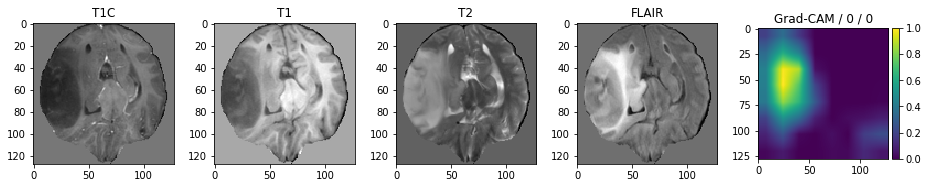

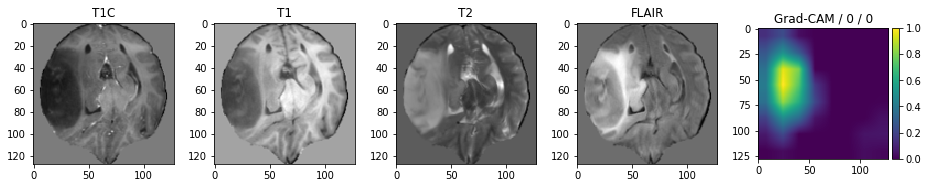

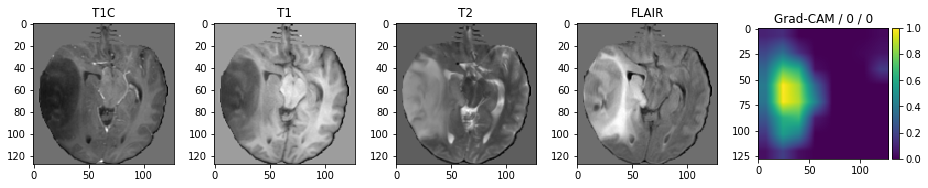

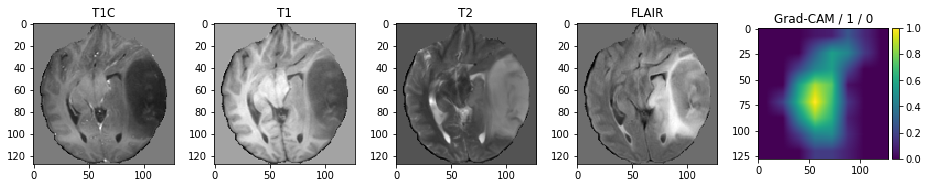

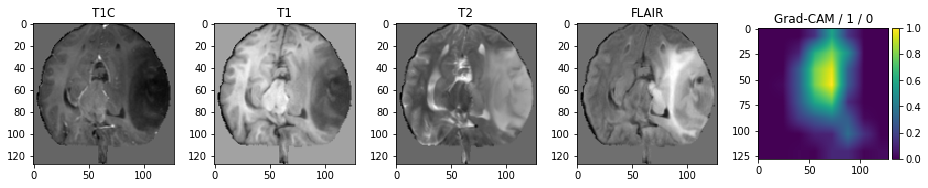

In [56]:
#3d_3_2
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig_title = ['T1C', 'T1', 'T2', 'FLAIR', 'Grad-CAM']
target_layer = 'features.conv5_x'
cnt = 0
gc = GradCAM(model, candidate_layers=[target_layer])

for x_batch, _, y_batch, _ in trainloader2:
    x_batch = x_batch.float().cuda()
    y_batch = y_batch.long().cuda()
    y_one = torch.ones_like(y_batch).cuda()
    y_zero = torch.zeros_like(y_batch).cuda()
    
    probs, ids = gc.forward(x_batch)
    gc.backward(ids[:, 0])
    regions = gc.generate(target_layer=target_layer)
    
#     gc.backward(ids[:, 1])
#     regions_one = gc.generate(target_layer=target_layer)
    
    for k in range(len(y_batch)):
        if y_batch[k].cpu() == 1:
            continue
        if cnt == 5:
            break
        cnt += 1
        fig, axes = plt.subplots(nrows=1, ncols=5, figsize=[13,13])
        for i in range(4):
            axes[i].imshow(x_batch[k,i].cpu().numpy(), 'gray')
            axes[i].set_title(fig_title[i])
            
        cam = axes[4].imshow(regions[k].cpu().squeeze().numpy())
        axes[4].set_title(fig_title[4] + ' / ' + str(ids[:, 0][k].cpu().numpy()) + ' / '  + str(y_batch[k].cpu().numpy()))
        divider = make_axes_locatable(axes[4])
        cax = divider.append_axes('right', size='5%', pad=0.05)
        plt.colorbar(cam, cax=cax)

        plt.tight_layout()

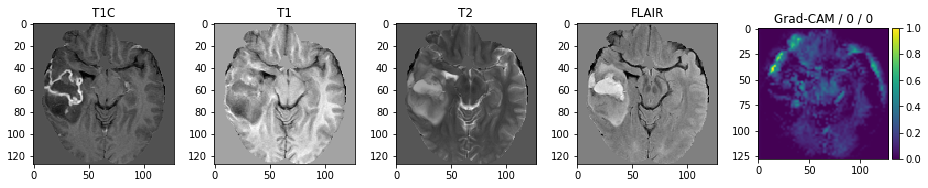

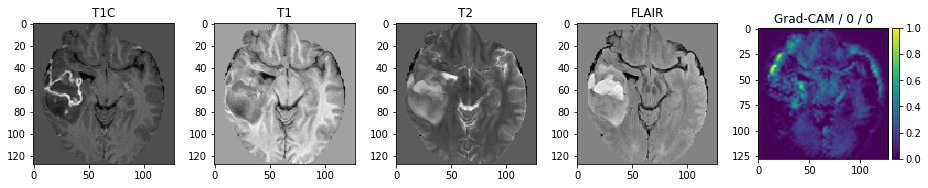

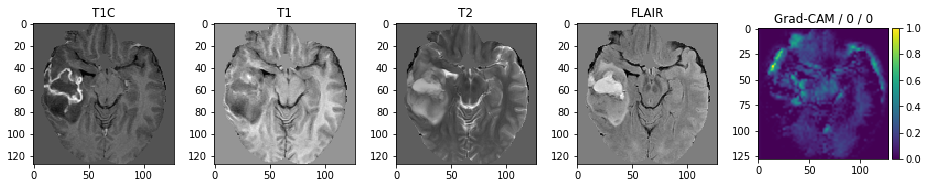

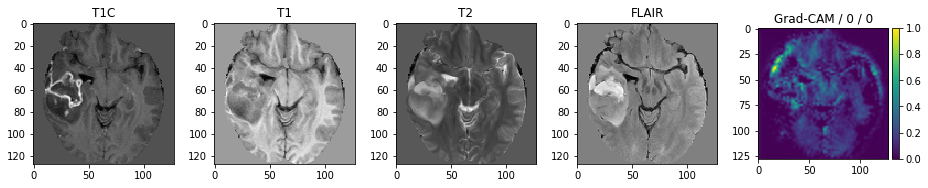

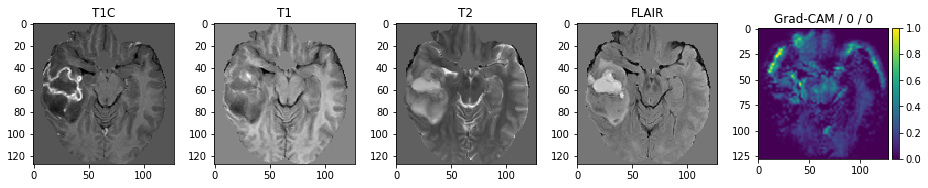

...

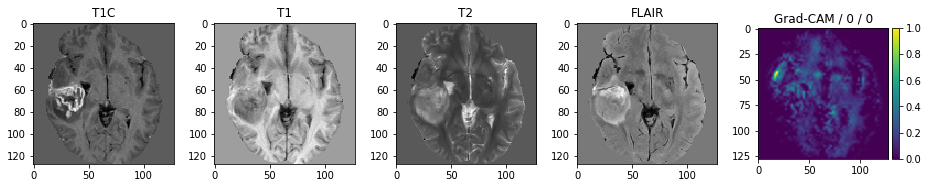

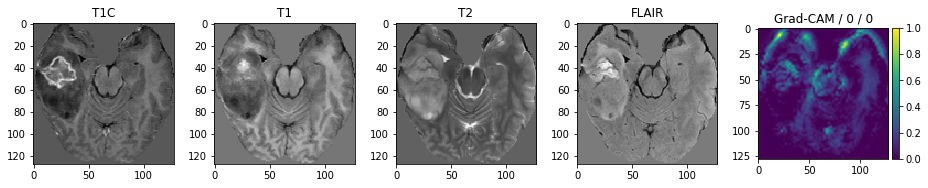

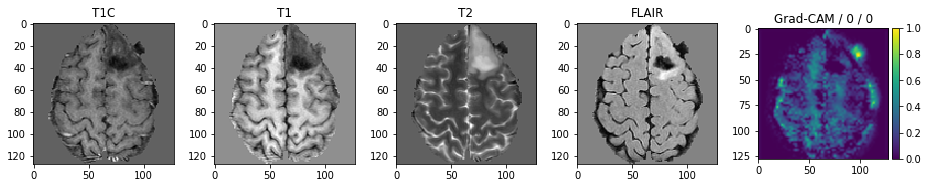

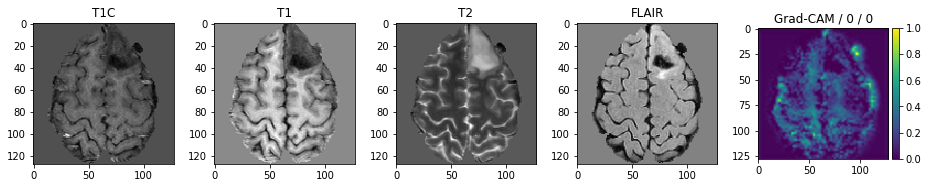

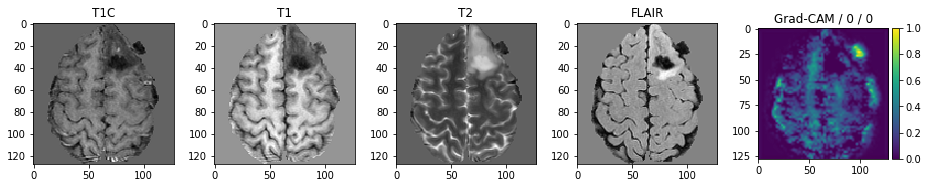

In [21]:
# 2d_3_2
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig_title = ['T1C', 'T1', 'T2', 'FLAIR', 'Grad-CAM']
target_layer = 'features.conv2_x'
cnt = 0
gc = GradCAM(model, candidate_layers=[target_layer])

for x_batch, _, y_batch in validloader2:
    x_batch = x_batch.float().cuda()
    y_batch = y_batch.long().cuda()
    y_one = torch.ones_like(y_batch).cuda()
    y_zero = torch.zeros_like(y_batch).cuda()
    
    probs, ids = gc.forward(x_batch)
    gc.backward(ids[:, 0])
    regions = gc.generate(target_layer=target_layer)
    
#     gc.backward(ids[:, 1])
#     regions_one = gc.generate(target_layer=target_layer)
    
    for k in range(len(y_batch)):
        if y_batch[k].cpu() == 1:
            continue
        if cnt == 20:
            break
        cnt += 1
        fig, axes = plt.subplots(nrows=1, ncols=5, figsize=[13,13])
        for i in range(4):
            axes[i].imshow(x_batch[k,i].cpu().numpy(), 'gray')
            axes[i].set_title(fig_title[i])
            
        cam = axes[4].imshow(regions[k].cpu().squeeze().numpy())
        axes[4].set_title(fig_title[4] + ' / ' + str(ids[:, 0][k].cpu().numpy()) + ' / '  + str(y_batch[k].cpu().numpy()))
        divider = make_axes_locatable(axes[4])
        cax = divider.append_axes('right', size='5%', pad=0.05)
        plt.colorbar(cam, cax=cax)

        plt.tight_layout()

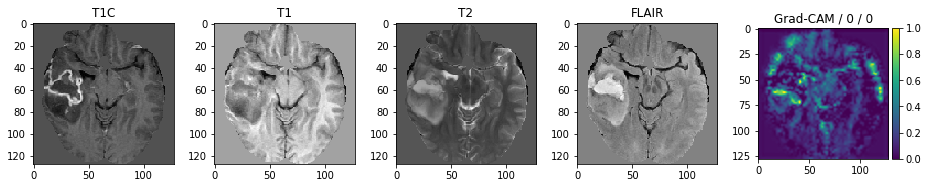

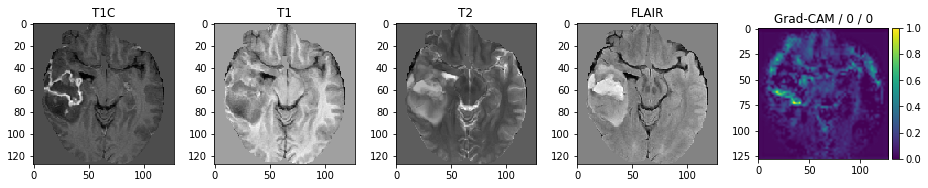

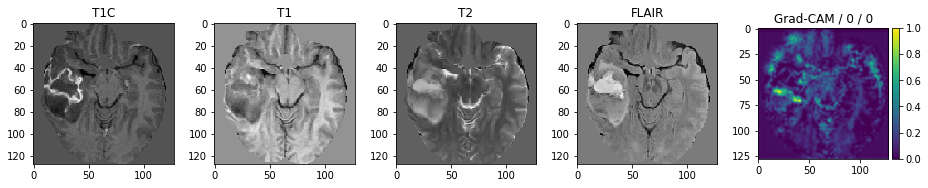

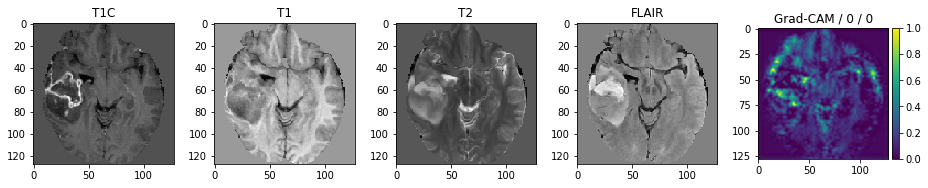

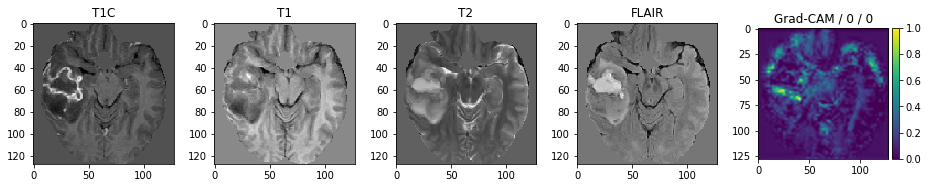

...

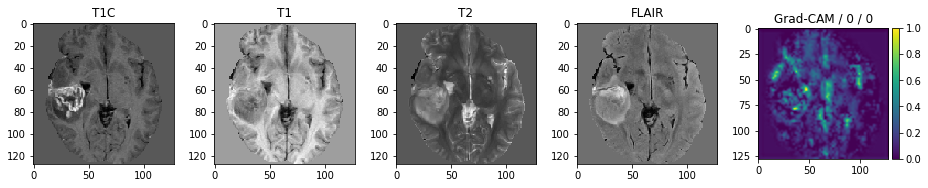

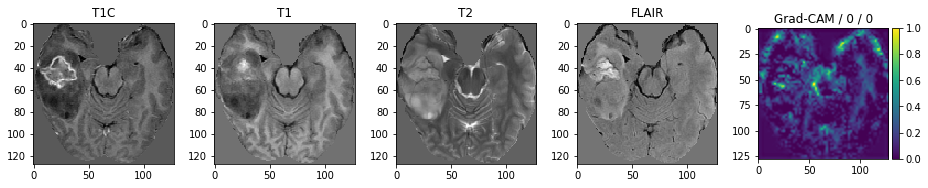

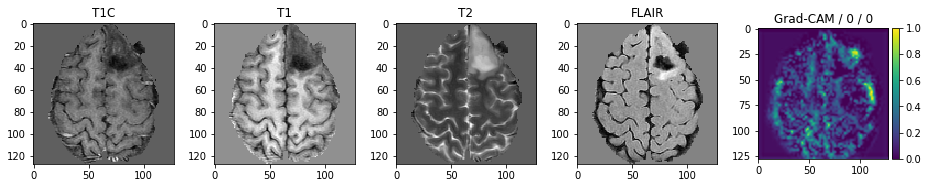

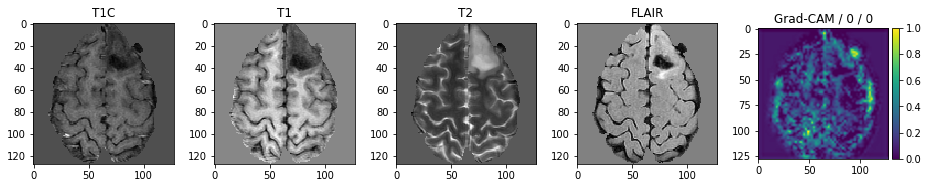

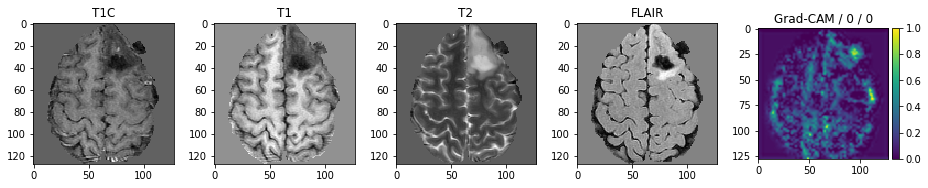

In [27]:
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig_title = ['T1C', 'T1', 'T2', 'FLAIR', 'Grad-CAM']
target_layer = 'features.conv2_x'
cnt = 0
gc = GradCAM(model, candidate_layers=[target_layer])

for x_batch, _, y_batch in validloader2:
    x_batch = x_batch.float().cuda()
    y_batch = y_batch.long().cuda()
    y_one = torch.ones_like(y_batch).cuda()
    y_zero = torch.zeros_like(y_batch).cuda()
    
    probs, ids = gc.forward(x_batch)
    gc.backward(ids[:, 0])
    regions = gc.generate(target_layer=target_layer)
    
#     gc.backward(ids[:, 1])
#     regions_one = gc.generate(target_layer=target_layer)
    
    for k in range(len(y_batch)):
        if y_batch[k].cpu() == 1:
            continue
        if cnt == 20:
            break
        cnt += 1
        fig, axes = plt.subplots(nrows=1, ncols=5, figsize=[13,13])
        for i in range(4):
            axes[i].imshow(x_batch[k,i].cpu().numpy(), 'gray')
            axes[i].set_title(fig_title[i])
            
        cam = axes[4].imshow(regions[k].cpu().squeeze().numpy())
        axes[4].set_title(fig_title[4] + ' / ' + str(ids[:, 0][k].cpu().numpy()) + ' / '  + str(y_batch[k].cpu().numpy()))
        divider = make_axes_locatable(axes[4])
        cax = divider.append_axes('right', size='5%', pad=0.05)
        plt.colorbar(cam, cax=cax)

        plt.tight_layout()

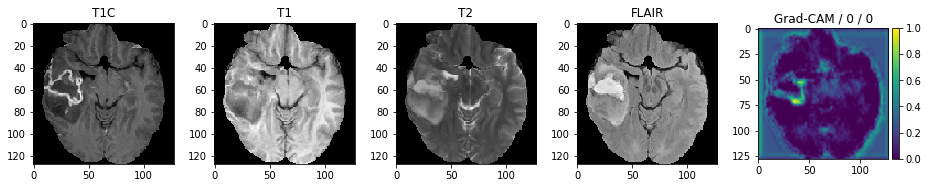

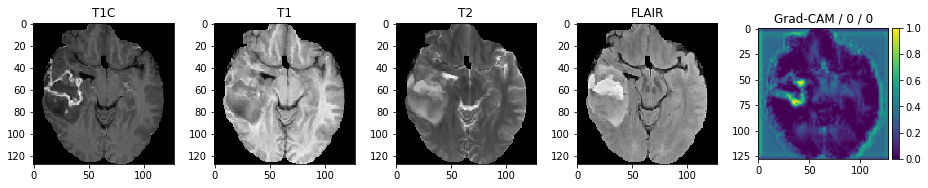

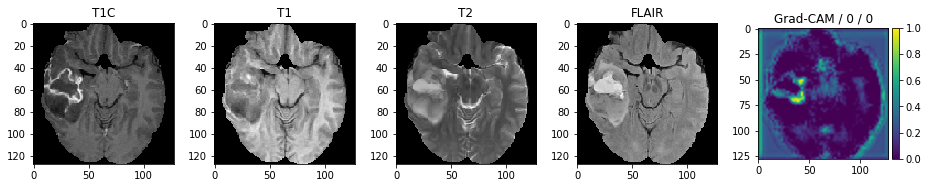

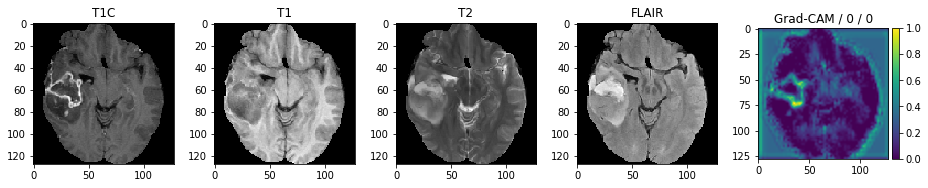

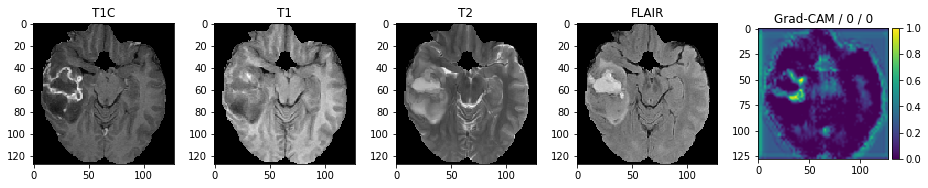

...

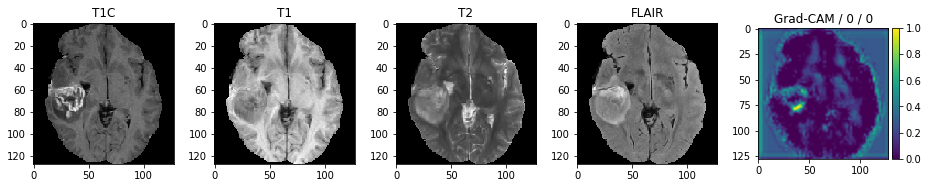

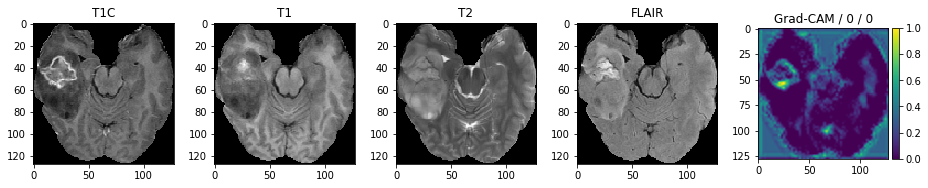

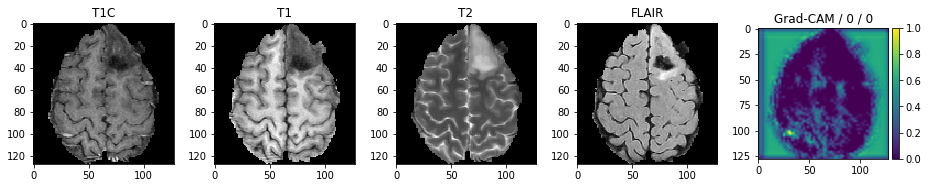

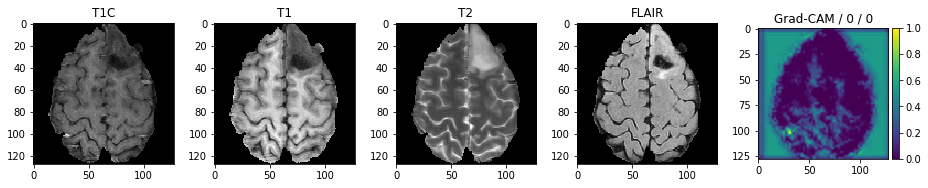

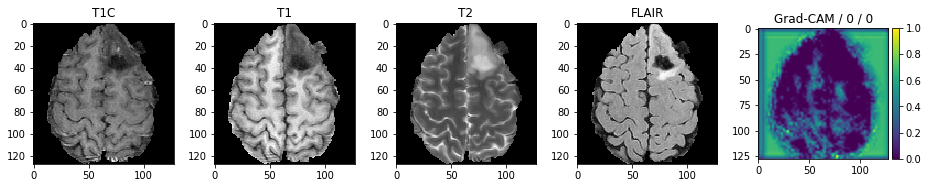

In [23]:
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig_title = ['T1C', 'T1', 'T2', 'FLAIR', 'Grad-CAM']
target_layer = 'features.conv2_x'
cnt = 0
gc = GradCAM(model, candidate_layers=[target_layer])

for x_batch, _, y_batch in validloader2:
    x_batch = x_batch.float().cuda()
    y_batch = y_batch.long().cuda()
    y_one = torch.ones_like(y_batch).cuda()
    y_zero = torch.zeros_like(y_batch).cuda()
    
    probs, ids = gc.forward(x_batch)
    gc.backward(ids[:, 0])
    regions = gc.generate(target_layer=target_layer)
    
#     gc.backward(ids[:, 1])
#     regions_one = gc.generate(target_layer=target_layer)
    
    for k in range(len(y_batch)):
        if y_batch[k].cpu() == 1:
            continue
        if cnt == 20:
            break
        cnt += 1
        fig, axes = plt.subplots(nrows=1, ncols=5, figsize=[13,13])
        for i in range(4):
            axes[i].imshow(x_batch[k,i].cpu().numpy(), 'gray')
            axes[i].set_title(fig_title[i])
            
        cam = axes[4].imshow(regions[k].cpu().squeeze().numpy())
        axes[4].set_title(fig_title[4] + ' / ' + str(ids[:, 0][k].cpu().numpy()) + ' / '  + str(y_batch[k].cpu().numpy()))
        divider = make_axes_locatable(axes[4])
        cax = divider.append_axes('right', size='5%', pad=0.05)
        plt.colorbar(cam, cax=cax)

        plt.tight_layout()

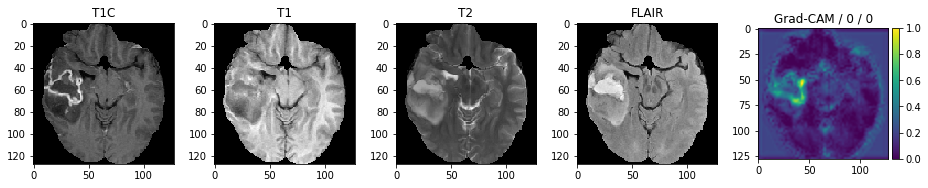

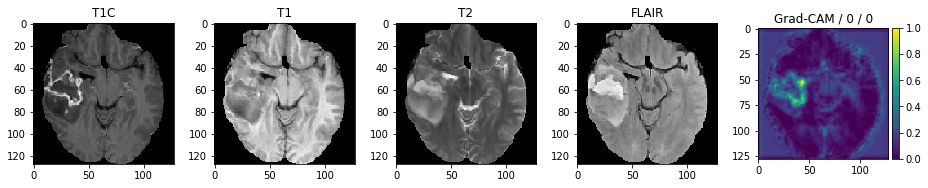

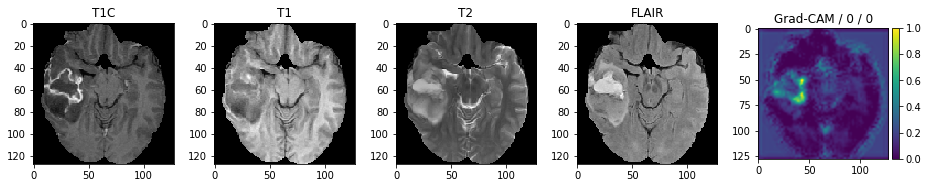

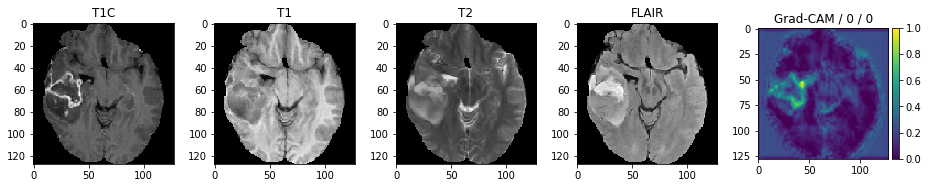

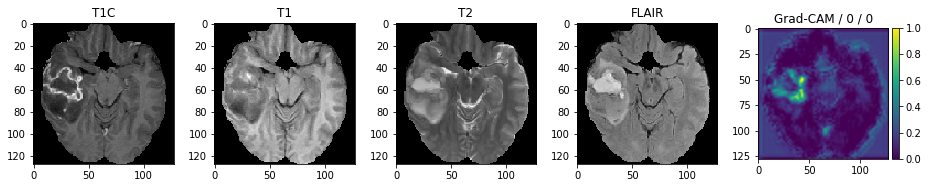

...

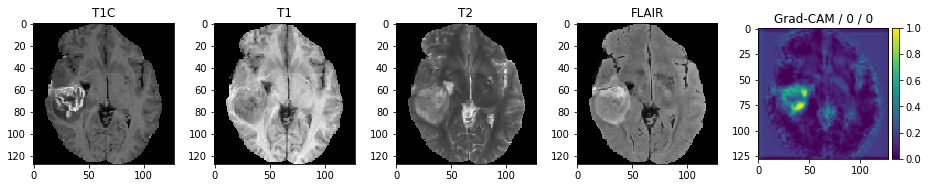

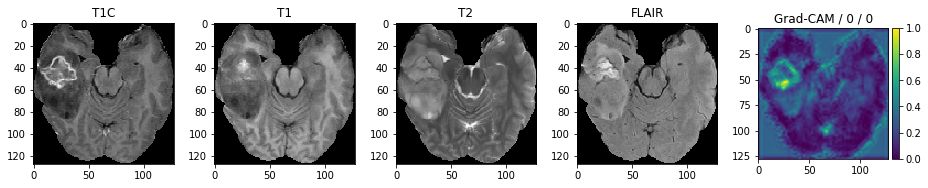

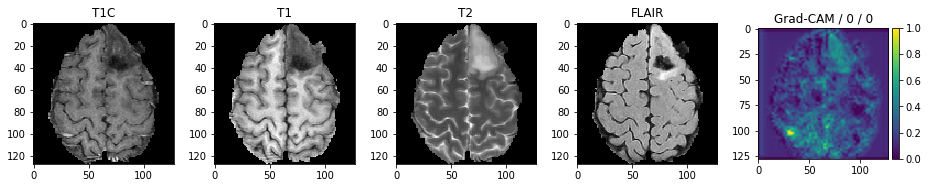

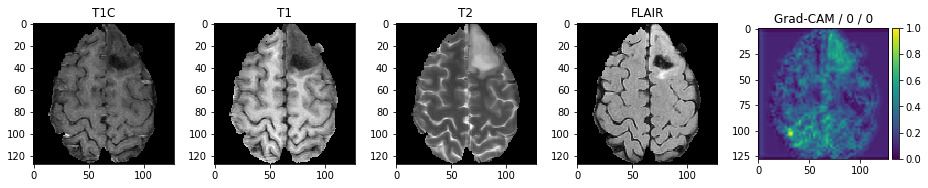

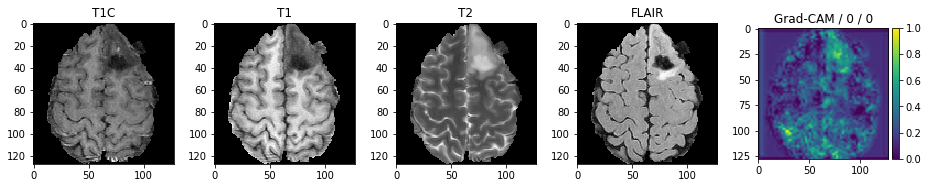

In [33]:
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig_title = ['T1C', 'T1', 'T2', 'FLAIR', 'Grad-CAM']
target_layer = 'features.conv2_x'
cnt = 0
gc = GradCAM(model, candidate_layers=[target_layer])

for x_batch, _, y_batch in validloader2:
    x_batch = x_batch.float().cuda()
    y_batch = y_batch.long().cuda()
    y_one = torch.ones_like(y_batch).cuda()
    y_zero = torch.zeros_like(y_batch).cuda()
    
    probs, ids = gc.forward(x_batch)
    gc.backward(ids[:, 0])
    regions = gc.generate(target_layer=target_layer)
    
#     gc.backward(ids[:, 1])
#     regions_one = gc.generate(target_layer=target_layer)
    
    for k in range(len(y_batch)):
        if y_batch[k].cpu() == 1:
            continue
        if cnt == 20:
            break
        cnt += 1
        fig, axes = plt.subplots(nrows=1, ncols=5, figsize=[13,13])
        for i in range(4):
            axes[i].imshow(x_batch[k,i].cpu().numpy(), 'gray')
            axes[i].set_title(fig_title[i])
            
        cam = axes[4].imshow(regions[k].cpu().squeeze().numpy())
        axes[4].set_title(fig_title[4] + ' / ' + str(ids[:, 0][k].cpu().numpy()) + ' / '  + str(y_batch[k].cpu().numpy()))
        divider = make_axes_locatable(axes[4])
        cax = divider.append_axes('right', size='5%', pad=0.05)
        plt.colorbar(cam, cax=cax)

        plt.tight_layout()

In [19]:
testloader = get_testloader(X_test, y_test)

va_y = []
va_pred = []
result_text = ''

with torch.no_grad():
    model.eval()
    model.cuda()
    # Valid accuracy
    for x_batch, _, y_batch in testloader:
        
        x_batch = x_batch.float().cuda()
        y_batch = y_batch.long().cuda()

        pred = model(x_batch)

        va_y.append(y_batch.cpu().data.numpy())
        va_pred.append(torch.softmax(pred, 1).cpu().data.numpy()[:, 1])

va_y = np.concatenate(va_y, 0)
va_pred = np.concatenate(va_pred, 0)
auc = metrics.roc_auc_score(va_y, va_pred)
acc, sensi, speci = sensi_speci(va_y, va_pred)
print(' / Test_Acc: {:.4f}, Test_AUC: {:.4f}, Test_sensi: {:.4f}, Test_speci: {:.4f}'.format(acc, auc, sensi, speci))

(969, 4, 128, 128)
 / Test_Acc: 0.8607, Test_AUC: 0.9120, Test_sensi: 0.8950, Test_speci: 0.7647


In [ ]:
Test_Acc: 0.8596, Test_AUC: 0.8647, Test_sensi: 0.9426, Test_speci: 0.6275

Text(0,0.5,'loss')

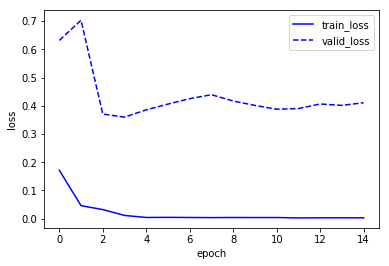

In [242]:
plt.plot(train_loss, 'b' ,label='train_loss')
plt.plot(valid_loss, 'b--' ,label='valid_loss')
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')

In [36]:
# torch.save(model.state_dict(), '/model/model_Fres_rnd')
# model.load_state_dict(torch.load('/model/model_vgg_rnd'))

In [35]:
va_y = []
va_pred = []
va_pred_missing = []
va_pred_missing1 = []
va_pred_missing2 = []
va_pred_missing3 = []
va_pred_missing4 = []
with torch.no_grad():
        model.eval()
        model.cuda()
        # Valid accuracy
        for x_batch, missing_batch, y_batch in validloader:
            
            x_batch = x_batch.float().cuda()
            missing_batch = missing_batch.float().cuda()
            y_batch = y_batch.long().cuda()
            pred = model(x_batch) # full data


            va_y.append(y_batch.cpu().data.numpy())
            va_pred.append(torch.softmax(pred, 1).cpu().data.numpy()[:, 1])


va_y = np.concatenate(va_y, 0)
va_pred = np.concatenate(va_pred, 0)

auc = metrics.roc_auc_score(va_y, va_pred)
acc, sensi, speci = sensi_speci(va_y, va_pred)
print('FULL / Valid_Acc_m: {:.4f}, Valid_AUC: {:.4f}, Valid_sensi: {:.4f}, Valid_speci: {:.4f}'.format(acc, auc, sensi, speci))


FULL / Valid_Acc_m: 0.8763, Valid_AUC: 0.9312, Valid_sensi: 0.9474, Valid_speci: 0.6841


In [25]:
m = [[1,0,0,0],
     [0,1,0,0],
     [0,0,1,0],
     [0,0,0,1],
     [1,1,0,0],
     [1,0,1,0],
     [1,0,0,1],
     [0,1,1,0],
     [0,1,0,1],
     [0,0,1,1],
     [1,1,1,0],
     [1,1,0,1],
     [1,0,1,1],
     [0,1,1,1],
     [1,1,1,1]]

for i in range(15):
    va_y = []
    va_pred = []
    result_text = ''
    if(m[i][0] == 1):
        result_text += 'T1c '
    else:
        result_text += '    '
    if(m[i][1] == 1):
        result_text += 'T1 '
    else:
        result_text += '   '
    if(m[i][2] == 1):
        result_text += 'T2 '
    else:
        result_text += '   '
    if(m[i][3] == 1):
        result_text += 'FLAIR'
    else:
        result_text += '     '
      
    with torch.no_grad():
        model.eval()
        model.cuda()
        # Valid accuracy
        for x_batch, _, y_batch in validloader:
          
            x_batch = x_batch.float().cuda()
            y_batch = y_batch.long().cuda()
            
            x_batch_m = x_batch.clone()
            if(m[i][0] == 0):
                x_batch_m[:, 0] = 0

            if(m[i][1] == 0):
                x_batch_m[:, 1] = 0

            if(m[i][2] == 0):
                x_batch_m[:, 2] = 0

            if(m[i][3] == 0):
                x_batch_m[:, 3] = 0


            pred = model(x_batch_m)

            va_y.append(y_batch.cpu().data.numpy())
            va_pred.append(torch.softmax(pred, 1).cpu().data.numpy()[:, 1])
            
    va_y = np.concatenate(va_y, 0)
    va_pred = np.concatenate(va_pred, 0)
    auc = metrics.roc_auc_score(va_y, va_pred)
    acc, sensi, speci = sensi_speci(va_y, va_pred)
    print(result_text + ' / Valid_Acc: {:.4f}, Valid_AUC: {:.4f}, Valid_sensi: {:.4f}, Valid_speci: {:.4f}'.format(acc, auc, sensi, speci))


T1c             / Valid_Acc: 0.8588, Valid_AUC: 0.9062, Valid_sensi: 0.9037, Valid_speci: 0.7353
    T1          / Valid_Acc: 0.7647, Valid_AUC: 0.8181, Valid_sensi: 0.9483, Valid_speci: 0.2598
       T2       / Valid_Acc: 0.7869, Valid_AUC: 0.7854, Valid_sensi: 0.9144, Valid_speci: 0.4363
          FLAIR / Valid_Acc: 0.7072, Valid_AUC: 0.7506, Valid_sensi: 0.8271, Valid_speci: 0.3775
T1c T1          / Valid_Acc: 0.8261, Valid_AUC: 0.8786, Valid_sensi: 0.8930, Valid_speci: 0.6422
T1c    T2       / Valid_Acc: 0.8497, Valid_AUC: 0.9173, Valid_sensi: 0.9216, Valid_speci: 0.6520
T1c       FLAIR / Valid_Acc: 0.8667, Valid_AUC: 0.9370, Valid_sensi: 0.9055, Valid_speci: 0.7598
    T1 T2       / Valid_Acc: 0.8458, Valid_AUC: 0.8662, Valid_sensi: 0.9537, Valid_speci: 0.5490
    T1    FLAIR / Valid_Acc: 0.7098, Valid_AUC: 0.8044, Valid_sensi: 0.8414, Valid_speci: 0.3480
       T2 FLAIR / Valid_Acc: 0.7386, Valid_AUC: 0.7985, Valid_sensi: 0.8520, Valid_speci: 0.4265
T1c T1 T2       / Valid_Acc: 0

In [25]:
testloader = get_testloader(X_test, y_test)
m = [[1,0,0,0],
     [0,1,0,0],
     [0,0,1,0],
     [0,0,0,1],
     [1,1,0,0],
     [1,0,1,0],
     [1,0,0,1],
     [0,1,1,0],
     [0,1,0,1],
     [0,0,1,1],
     [1,1,1,0],
     [1,1,0,1],
     [1,0,1,1],
     [0,1,1,1],
     [1,1,1,1]]

for i in range(15):
    va_y = []
    va_pred = []
    result_text = ''
    if(m[i][0] == 1):
        result_text += 'T1c '
    else:
        result_text += '    '
    if(m[i][1] == 1):
        result_text += 'T1 '
    else:
        result_text += '   '
    if(m[i][2] == 1):
        result_text += 'T2 '
    else:
        result_text += '   '
    if(m[i][3] == 1):
        result_text += 'FLAIR'
    else:
        result_text += '     '
      
    with torch.no_grad():
        model.eval()
        model.cuda()
        # Valid accuracy
        for x_batch, _, y_batch in testloader:
          
            x_batch = x_batch.float().cuda()
            y_batch = y_batch.long().cuda()
            
            x_batch_m = x_batch.clone()
            if(m[i][0] == 0):
                x_batch_m[:, 0] = 0

            if(m[i][1] == 0):
                x_batch_m[:, 1] = 0

            if(m[i][2] == 0):
                x_batch_m[:, 2] = 0

            if(m[i][3] == 0):
                x_batch_m[:, 3] = 0


            pred = model(x_batch_m)

            va_y.append(y_batch.cpu().data.numpy())
            va_pred.append(torch.softmax(pred, 1).cpu().data.numpy()[:, 1])
            
    va_y = np.concatenate(va_y, 0)
    va_pred = np.concatenate(va_pred, 0)
    auc = metrics.roc_auc_score(va_y, va_pred)
    acc, sensi, speci = sensi_speci(va_y, va_pred)
    print(result_text + ' / Valid_Acc: {:.4f}, Valid_AUC: {:.4f}, Valid_sensi: {:.4f}, Valid_speci: {:.4f}'.format(acc, auc, sensi, speci))


(969, 4, 128, 128)
T1c             / Valid_Acc: 0.3137, Valid_AUC: 0.6742, Valid_sensi: 0.0686, Valid_speci: 1.0000
    T1          / Valid_Acc: 0.7368, Valid_AUC: 0.3527, Valid_sensi: 1.0000, Valid_speci: 0.0000
       T2       / Valid_Acc: 0.6130, Valid_AUC: 0.6483, Valid_sensi: 0.6681, Valid_speci: 0.4588
          FLAIR / Valid_Acc: 0.2632, Valid_AUC: 0.6824, Valid_sensi: 0.0000, Valid_speci: 1.0000
T1c T1          / Valid_Acc: 0.4303, Valid_AUC: 0.7789, Valid_sensi: 0.2269, Valid_speci: 1.0000
T1c    T2       / Valid_Acc: 0.3364, Valid_AUC: 0.7806, Valid_sensi: 0.0994, Valid_speci: 1.0000
T1c       FLAIR / Valid_Acc: 0.3529, Valid_AUC: 0.6288, Valid_sensi: 0.1331, Valid_speci: 0.9686
    T1 T2       / Valid_Acc: 0.7368, Valid_AUC: 0.4874, Valid_sensi: 1.0000, Valid_speci: 0.0000
    T1    FLAIR / Valid_Acc: 0.3581, Valid_AUC: 0.3836, Valid_sensi: 0.3053, Valid_speci: 0.5059
       T2 FLAIR / Valid_Acc: 0.2982, Valid_AUC: 0.7183, Valid_sensi: 0.0476, Valid_speci: 1.0000
T1c T1 T2  